# NETW 1013 Clustering Project

**Objective:**
The objective of this project is to teach students how to apply clustering to real datasets.

You should be able to answer the following questions and provide reasonable justification for your answers:
* Which clustering approach have you decided to use on each dataset?
* Compare between Kmeans, Hierarchal and DBScan.
* Discuss how you tuned your clustering hyperparameters to achieve the best cluster assignment?
* What is the effect of different distance functions on the calculated clusters?
* How did you evaluate the performance of different clustering techniques on different datatsets?
* Visualize your output where applicable.
* What is the effect of scaling on the performance of clustering techniques?






Running this project requires the following imports:

In [ ]:
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import sklearn.preprocessing as prep
from sklearn.datasets import make_blobs
from plotnine import *
# StandardScaler is a function to normalize the data
# You may also check MinMaxScaler and MaxAbsScaler
#from sklearn.preprocessing import StandardScaler

from sklearn.cluster import DBSCAN


from sklearn.cluster import KMeans

from sklearn.metrics import silhouette_score

%matplotlib inline
# Please refer to the sklearn documentation to learn more about the different parameters for each clustering technique.

In [ ]:
# helper function that allows us to display data in 2 dimensions an highlights the clusters
def display_cluster(X,km=[],num_clusters=0):
    color = 'brgcmyk'  #List colors
    alpha = 0.5
    s = 20
    if num_clusters == 0:
        plt.scatter(X[:,0],X[:,1],c = color[0],alpha = alpha,s = s)
    else:
        for i in range(num_clusters):
            plt.scatter(X[km.labels_==i,0],X[km.labels_==i,1],c = color[i],alpha = alpha,s=s)
            plt.scatter(km.cluster_centers_[i][0],km.cluster_centers_[i][1],c = color[i], marker = 'x', s = 100)

## Multi Blob Data Set
* The dataset generated below is known to be best clustered into 6 clusters.
* Cluster the data set below using the three different clustering techniques discussed in the course.
* Visualize your clustering output in each step of your work.



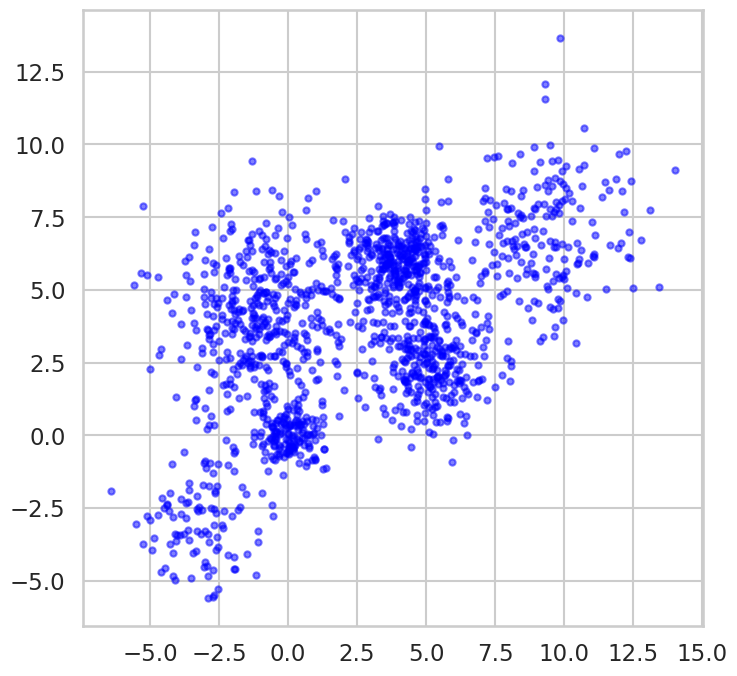

In [ ]:
#Data Generation and Visualization
plt.rcParams['figure.figsize'] = [8,8]
sns.set_style("whitegrid")
sns.set_context("talk")

n_bins = 6
centers = [(-3, -3), (0, 0), (5,2.5),(-1, 4), (4, 6), (9,7)]
Multi_blob_Data, y = make_blobs(n_samples=[100,150, 300, 400,300, 200], n_features=2, cluster_std=[1.3,0.6, 1.2, 1.7,0.9,1.7],
                  centers=centers, shuffle=False, random_state=42)
display_cluster(Multi_blob_Data)

### Kmeans
* Use Kmeans with different values of K to cluster the above data.
* Display the outcome of each value of K.
* Plot distortion function versus K and choose the approriate value of K.
* Plot the silhouette_score versus K and use it to choose the best K.
* Store the silhouette_score for the best K for later comparison with other clustering techniques.
* Comment on the effect of centroid initialization on cluster assignment.
* Hint: Lookup k-means++ .

1) Use Kmeans with different values of K to cluster the above data.

---


2) Display the outcome of each value of K.

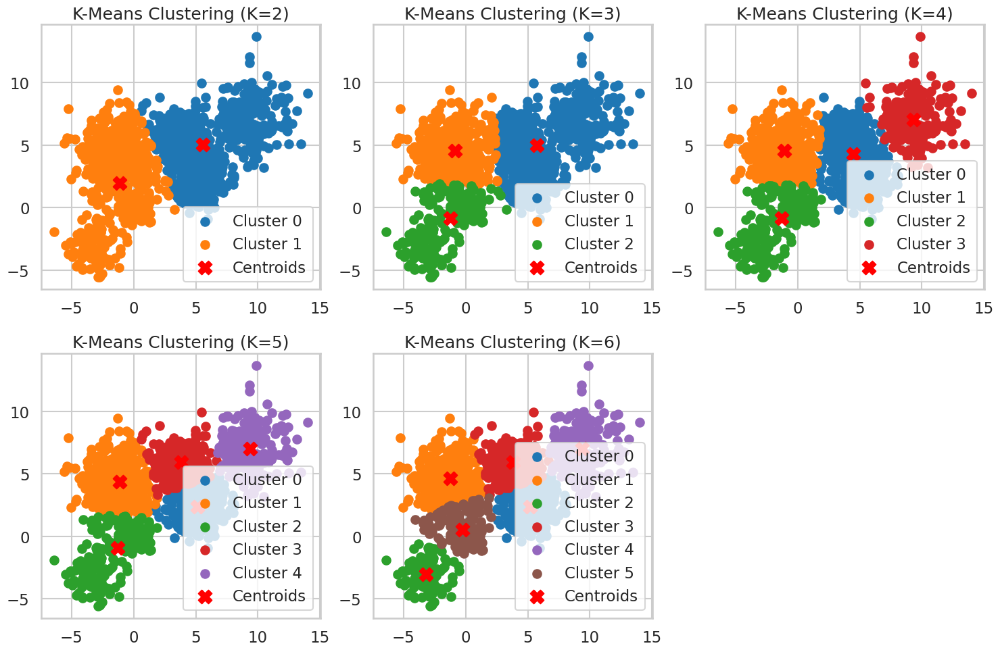

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs

# Generate multi-blob dataset
centers = [(-3, -3), (0, 0), (5,2.5),(-1, 4), (4, 6), (9,7)]
X, _ = make_blobs(n_samples=[100,150, 300, 400,300, 200], n_features=2,
                  cluster_std=[1.3,0.6, 1.2, 1.7,0.9,1.7],
                  centers=centers, shuffle=False, random_state=42)

# Define K values to test
K_values = [2, 3, 4, 5, 6]

# Set plot style
sns.set_style("whitegrid")
plt.figure(figsize=(15, 10))

# Apply K-Means for each K and plot results
for i, k in enumerate(K_values, 1):
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
    labels = kmeans.fit_predict(X)

    plt.subplot(2, 3, i)  # Create subplots
    for j in range(k):
        plt.scatter(X[labels == j, 0], X[labels == j, 1], label=f'Cluster {j}')

    # Plot centroids
    plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1],
                c='red', marker='X', s=200, label='Centroids')

    plt.title(f'K-Means Clustering (K={k})')
    plt.legend()

plt.tight_layout()
plt.show()


3) Plot distortion function versus K and choose the approriate value of K.




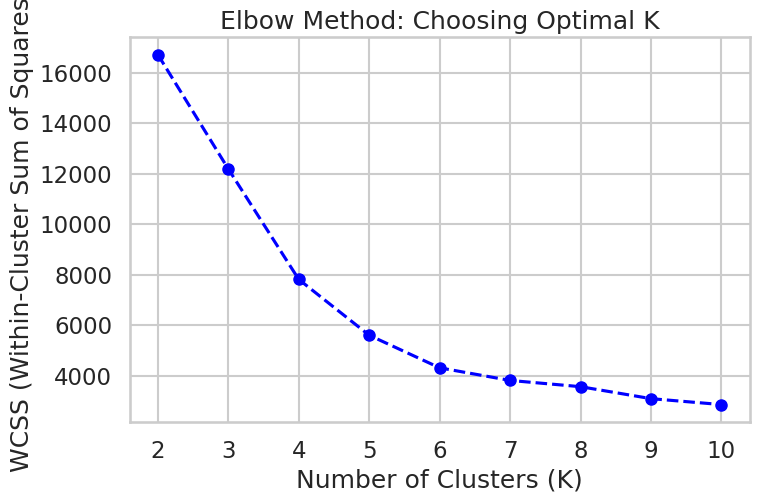

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Define range of K values
K_range = range(2, 11)

# Compute WCSS (Within-Cluster Sum of Squares) for each K
wcss = []  # Store WCSS values

for k in K_range:
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)  # Store distortion score (WCSS)

# Plot Elbow Method
plt.figure(figsize=(8,5))
plt.plot(K_range, wcss, marker='o', linestyle='--', color='b', markersize=8)
plt.xlabel('Number of Clusters (K)')
plt.ylabel('WCSS (Within-Cluster Sum of Squares)')
plt.title('Elbow Method: Choosing Optimal K')
plt.xticks(K_range)
plt.grid(True)
plt.show()


The curve bends sharply around K = 6, meaning it's likely the optimal number of clusters.

***4) Plot the silhouette_score versus K and use it to choose the best K.***

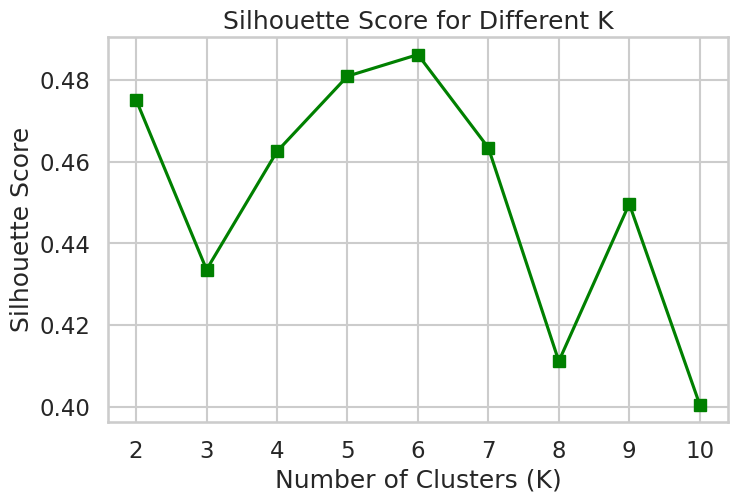

Best K based on Silhouette Score: 6 with Score: 0.4862


In [ ]:
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Compute Silhouette Scores for K = 2 to 10
sil_scores = []
K_range = range(2, 11)

for k in K_range:
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
    labels = kmeans.fit_predict(X)
    sil_scores.append(silhouette_score(X, labels))  # Compute Silhouette Score

# Plot Silhouette Score vs. K
plt.figure(figsize=(8,5))
plt.plot(K_range, sil_scores, marker='s', linestyle='-', color='g', markersize=8)
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for Different K')
plt.xticks(K_range)
plt.grid(True)
plt.show()

# Identify best K based on highest Silhouette Score
best_K = K_range[sil_scores.index(max(sil_scores))]
best_silhouette = max(sil_scores)

print(f"Best K based on Silhouette Score: {best_K} with Score: {best_silhouette:.4f}")


The Silhouette Score confirms K = 6 as the best number of clusters, which aligns with our Elbow Method findings.

***4) Store the silhouette_score for the best K for later comparison with other clustering techniques.***

In [ ]:
# Store the silhouette score for K-Means (K=6)
clustering_scores = {}
clustering_scores['KMeans_K6'] = 0.4862  # The best silhouette score from our results

# Display stored score
print("Stored Clustering Scores:", clustering_scores)


Stored Clustering Scores: {'KMeans_K6': 0.4862}


5) Comment on the effect of centroid initialization on cluster assignment.
Hint: Lookup k-means++ .

In K-Means clustering, the choice of initial cluster centroids significantly affects the final cluster assignment and convergence speed.

Random Initialization Problem
If centroids are chosen randomly:

✅ The algorithm might converge to local minima (bad clustering).

✅ Results may vary between runs (unstable clusters).

✅ Poor initialization can lead to slow convergence.

Solution: k-means++ Initialization

Instead of random initialization, k-means++ is an improved method that:

🔹 Selects the first centroid randomly.

🔹 Chooses remaining centroids smartly, ensuring they are far apart.

🔹 Reduces the chance of bad cluster assignments.

🔹 Speeds up convergence and improves accuracy.

We already used k-means++ in our implementation:

kmeans = KMeans(n_clusters=6, init='k-means++', random_state=42)

### Hierarchal Clustering
* Use AgglomerativeClustering function to  to cluster the above data.
* In the  AgglomerativeClustering change the following parameters:
    * Affinity (use euclidean, manhattan and cosine)
    * Linkage(try different options)
    * Distance_threshold (try different options)
* Plot the dendrograph for one trial.
* For each of these trials, calculate the silhouette_score and display the resulting clusters.  
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques.
* Record your observation.

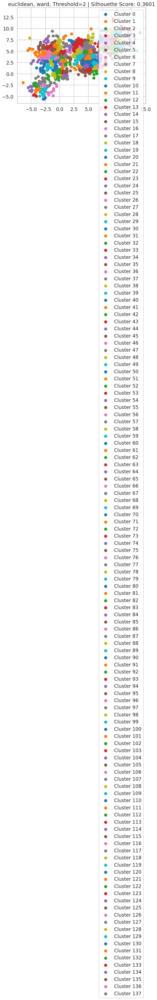

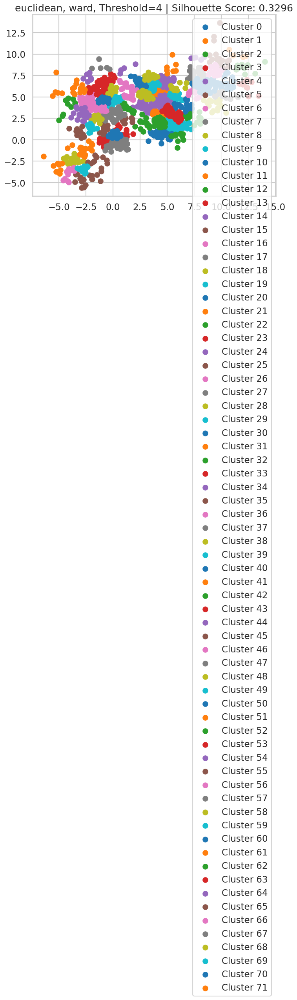

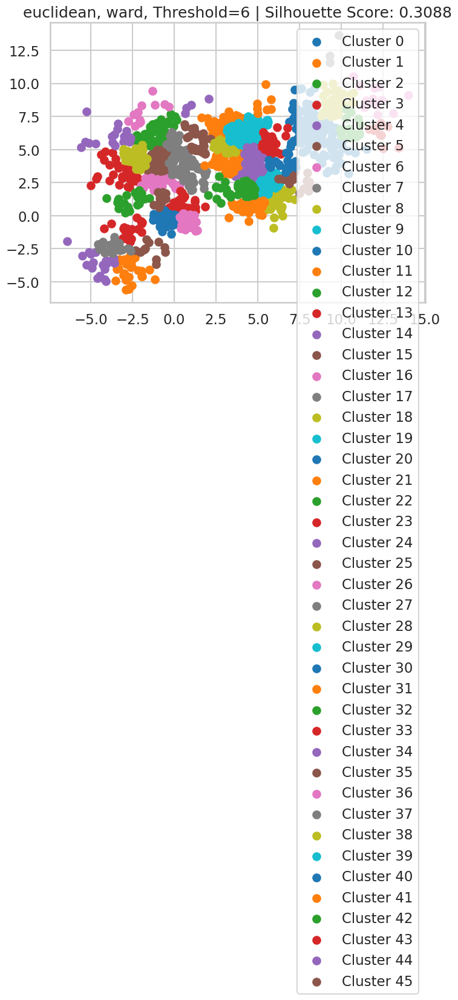

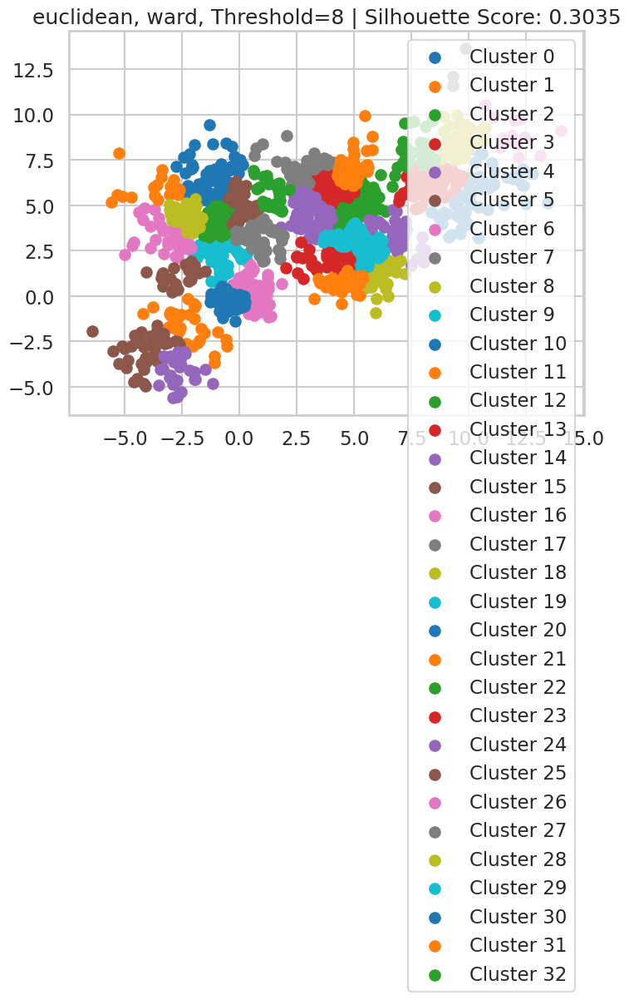

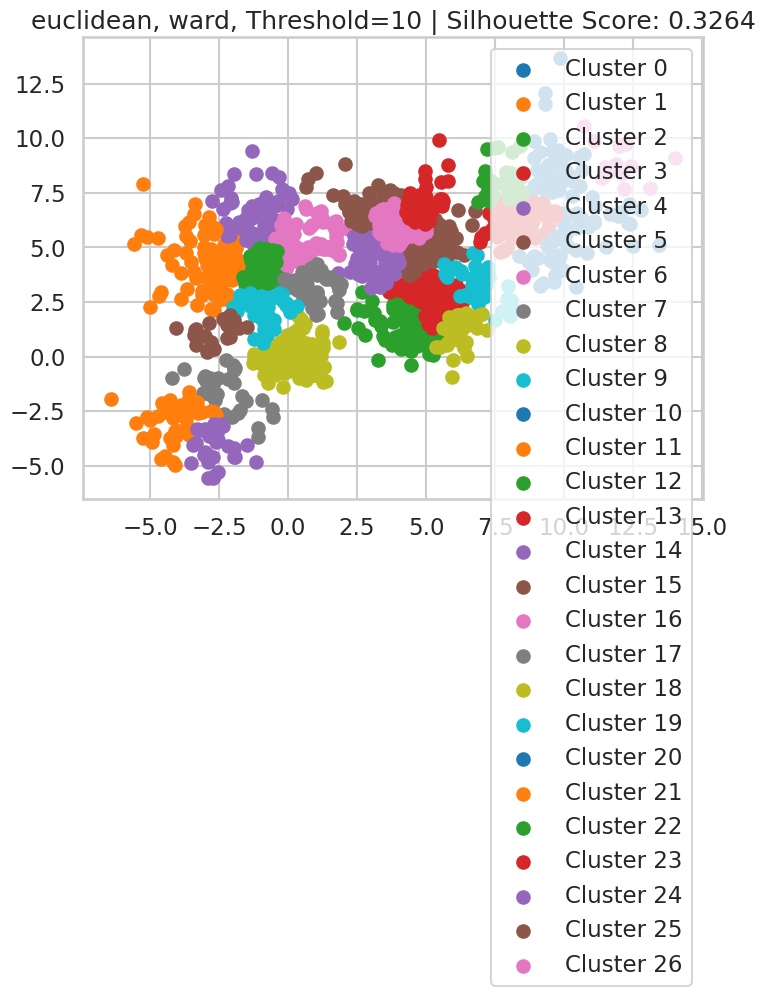

...

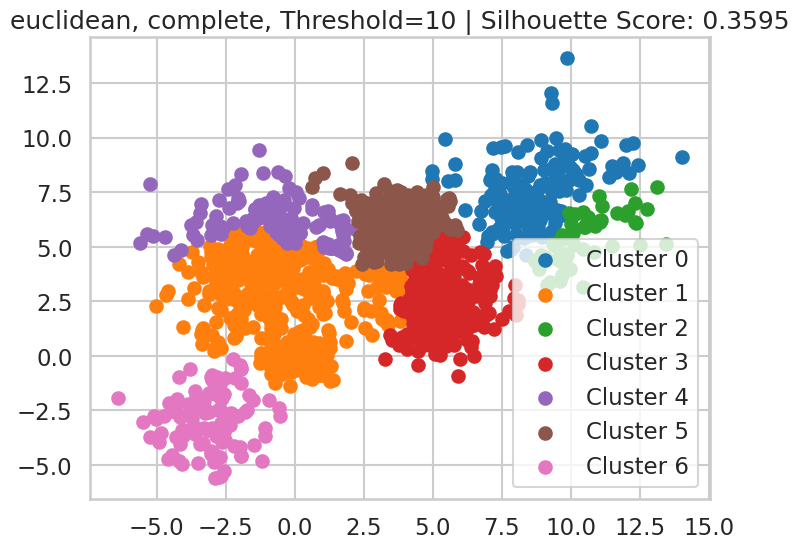

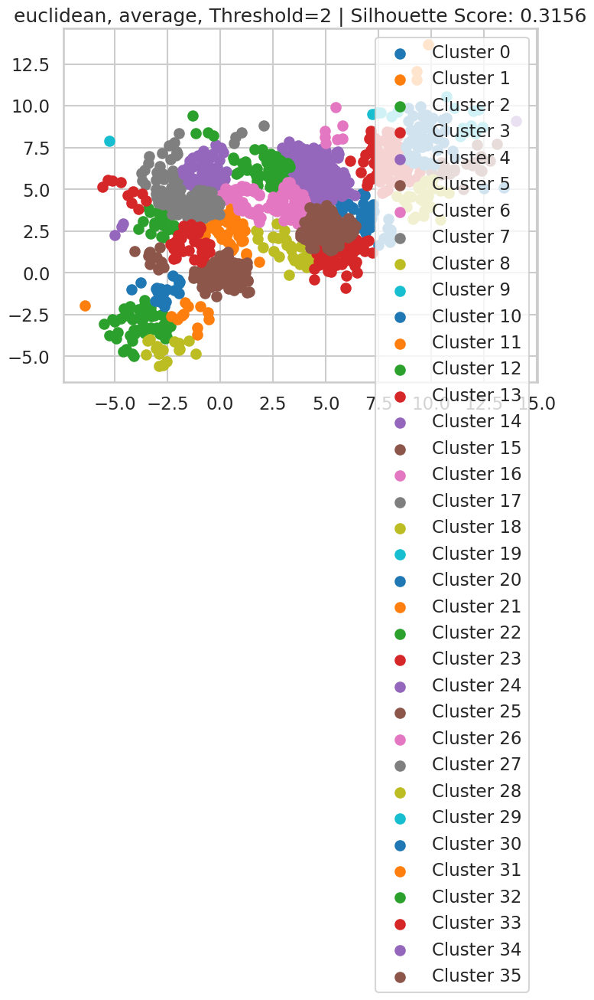

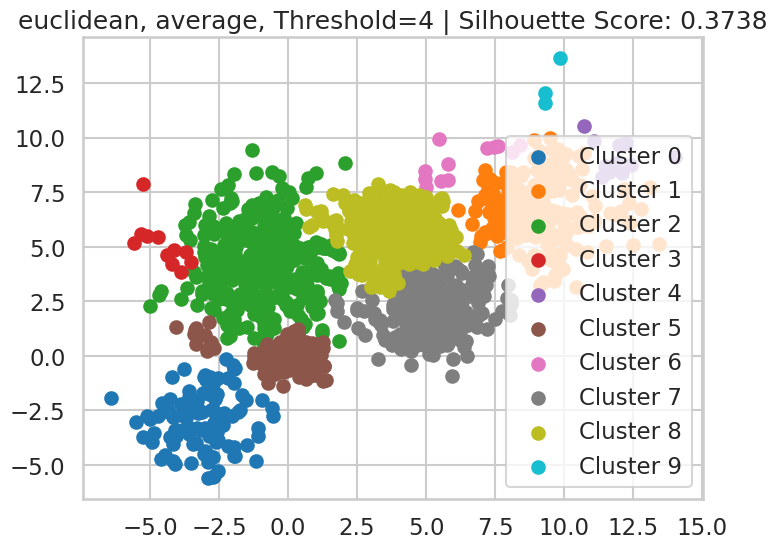

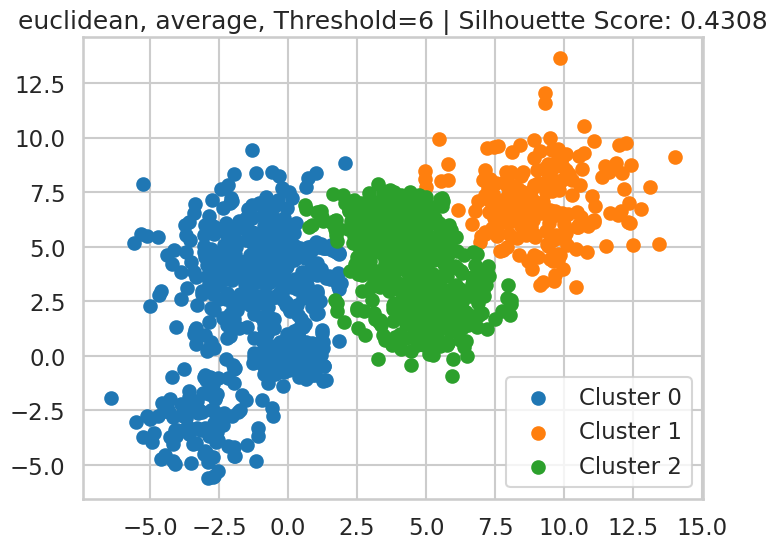

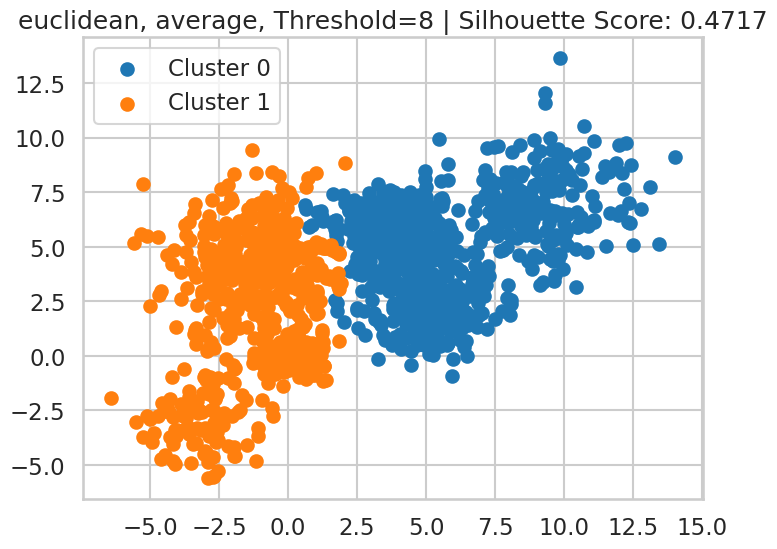

Error with configuration euclidean, average, Threshold=10: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)


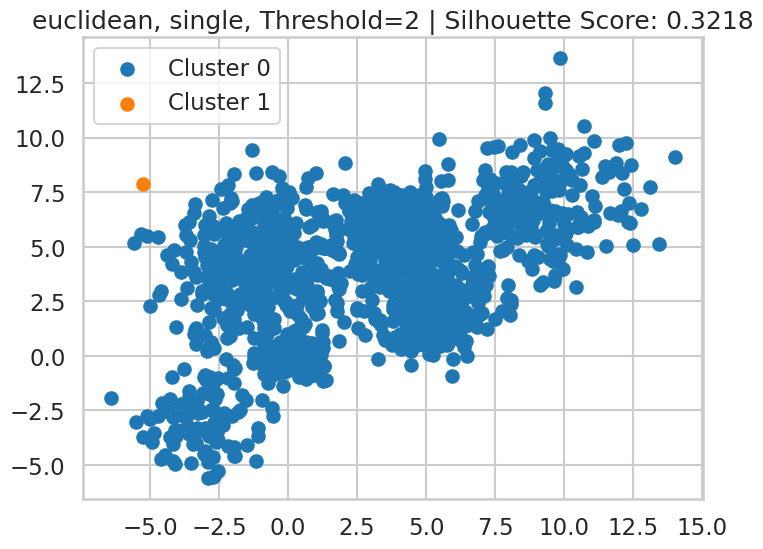

Error with configuration euclidean, single, Threshold=4: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Error with configuration euclidean, single, Threshold=6: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Error with configuration euclidean, single, Threshold=8: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Error with configuration euclidean, single, Threshold=10: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)


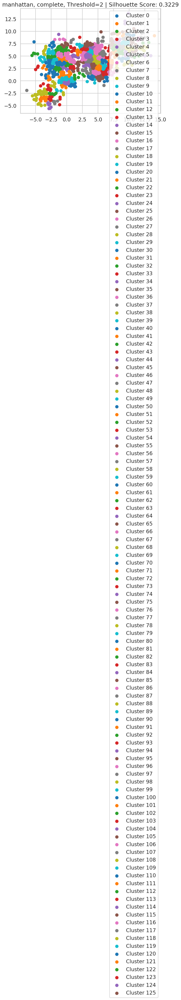

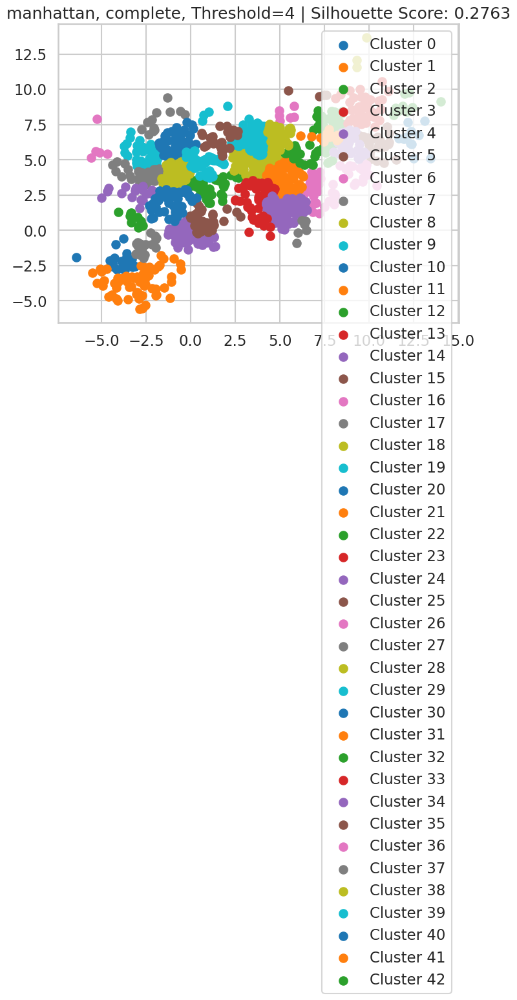

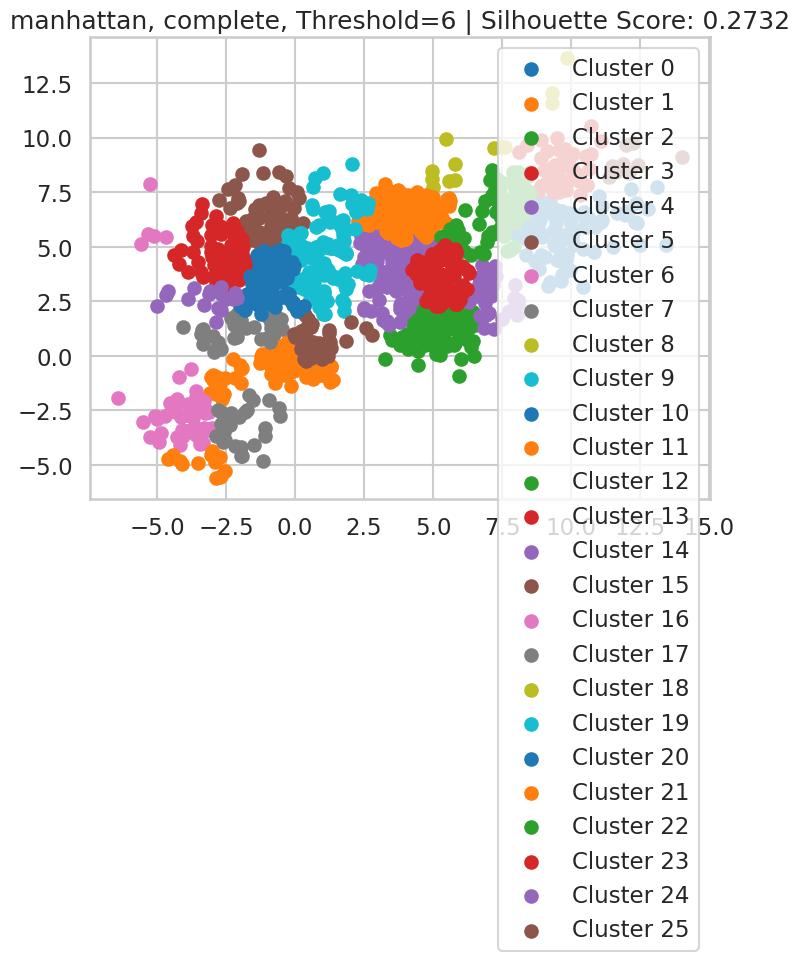

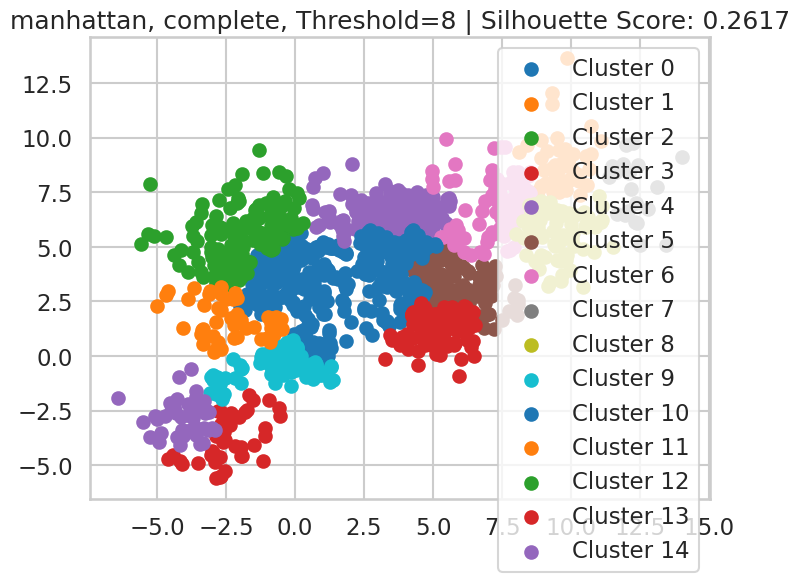

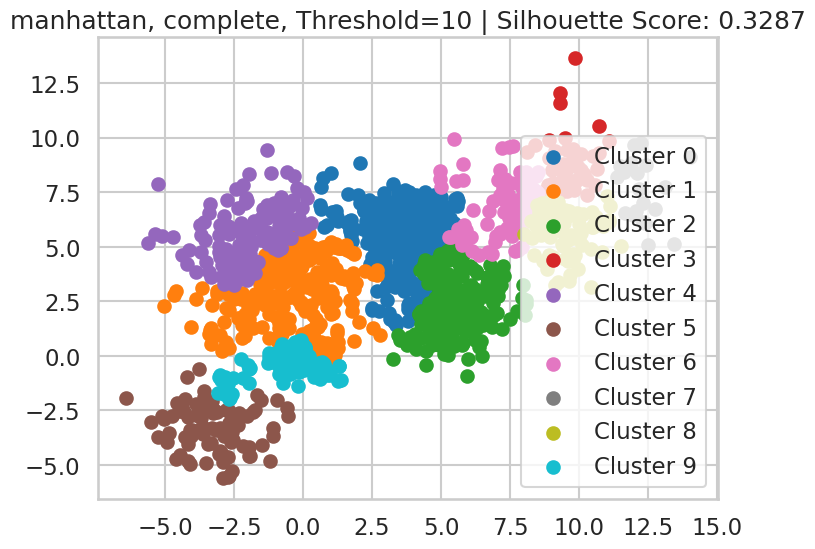

...

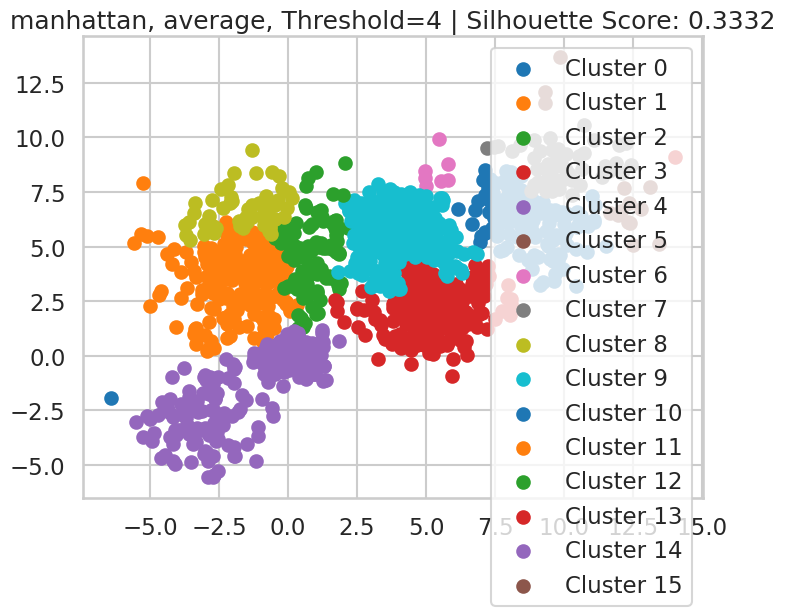

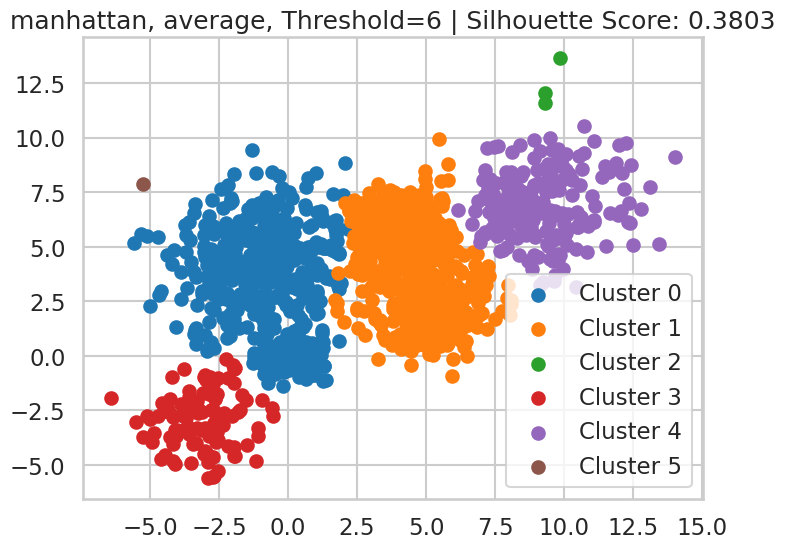

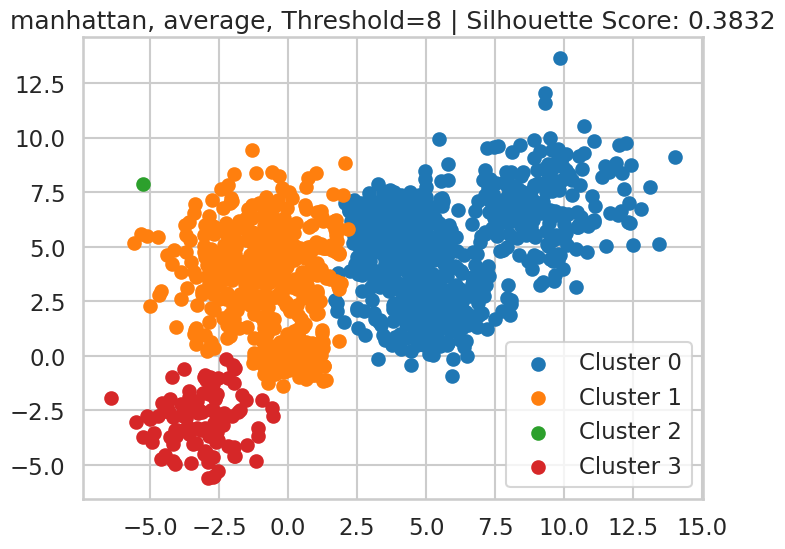

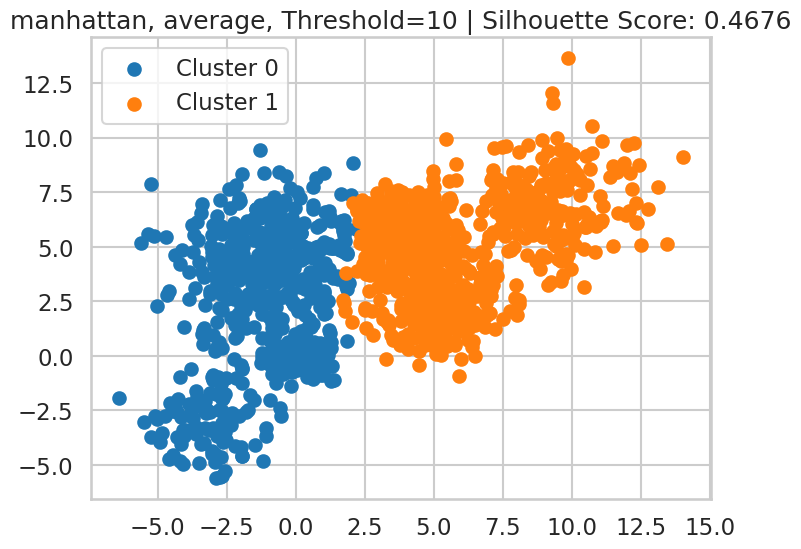

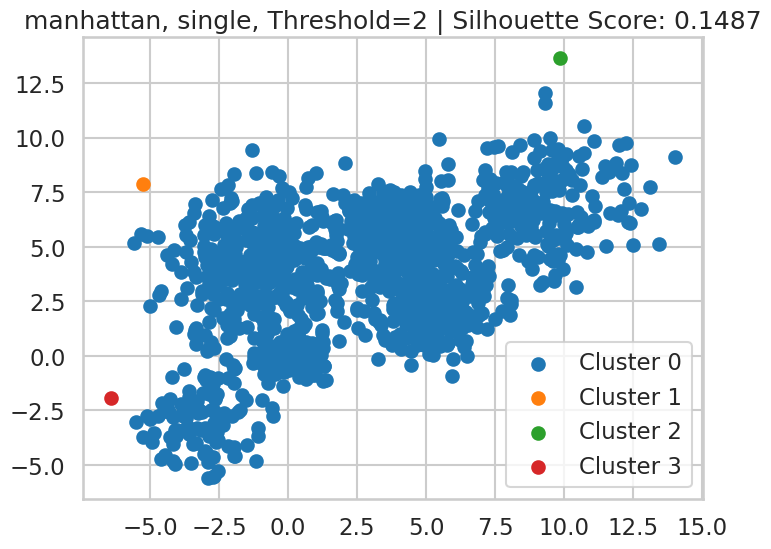

Error with configuration manhattan, single, Threshold=4: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Error with configuration manhattan, single, Threshold=6: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Error with configuration manhattan, single, Threshold=8: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Error with configuration manhattan, single, Threshold=10: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Error with configuration cosine, complete, Threshold=2: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Error with configuration cosine, complete, Threshold=4: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Error with configuration cosine, complete, Threshold=6: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Error with configuration cosine, complete, Threshold=8: Number of labels is 1. Valid values are 2 to n_sam

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score

# Define possible affinities, linkages, and distance thresholds
affinities = ['euclidean', 'manhattan', 'cosine']
linkages = ['ward', 'complete', 'average', 'single']
thresholds = [2, 4, 6, 8, 10]

# Variables to track best results
best_score = -1
optimal_params = {}

# Prepare to store results for comparison
agg_results = {}

# Iterate over different configurations of affinity, linkage, and distance threshold
for affinity in affinities:
    for linkage in linkages:
        for threshold in thresholds:
            try:
                # Skip incompatible combinations (e.g., 'ward' needs 'euclidean')
                if linkage == 'ward' and affinity != 'euclidean':
                    continue

                # Initialize the Agglomerative Clustering model
                model = AgglomerativeClustering(n_clusters=None, metric=affinity, linkage=linkage, distance_threshold=threshold)

                # Fit model and get cluster labels
                labels = model.fit_predict(X)

                # Compute the silhouette score
                score = silhouette_score(X, labels)
                agg_results[(affinity, linkage, threshold)] = score

                # Track the best clustering configuration
                if score > best_score:
                    best_score = score
                    optimal_params = {'affinity': affinity, 'linkage': linkage, 'distance_threshold': threshold}

                # Visualize the clustering result
                plt.figure(figsize=(8, 6))
                for cluster_num in np.unique(labels):
                    plt.scatter(X[labels == cluster_num, 0], X[labels == cluster_num, 1], label=f'Cluster {cluster_num}')
                plt.title(f'{affinity}, {linkage}, Threshold={threshold} | Silhouette Score: {score:.4f}')
                plt.legend()
                plt.show()

            except Exception as e:
                print(f"Error with configuration {affinity}, {linkage}, Threshold={threshold}: {e}")

# Print summary of results
print("\nClustering Performance for Different Configurations:")
for config, score in agg_results.items():
    print(f"Affinity={config[0]}, Linkage={config[1]}, Threshold={config[2]} → Silhouette Score: {score:.4f}")

# Output the best parameters and score
print(f"\nOptimal Agglomerative Clustering Configuration: {optimal_params}")
print(f"Best Silhouette Score: {best_score:.4f}")


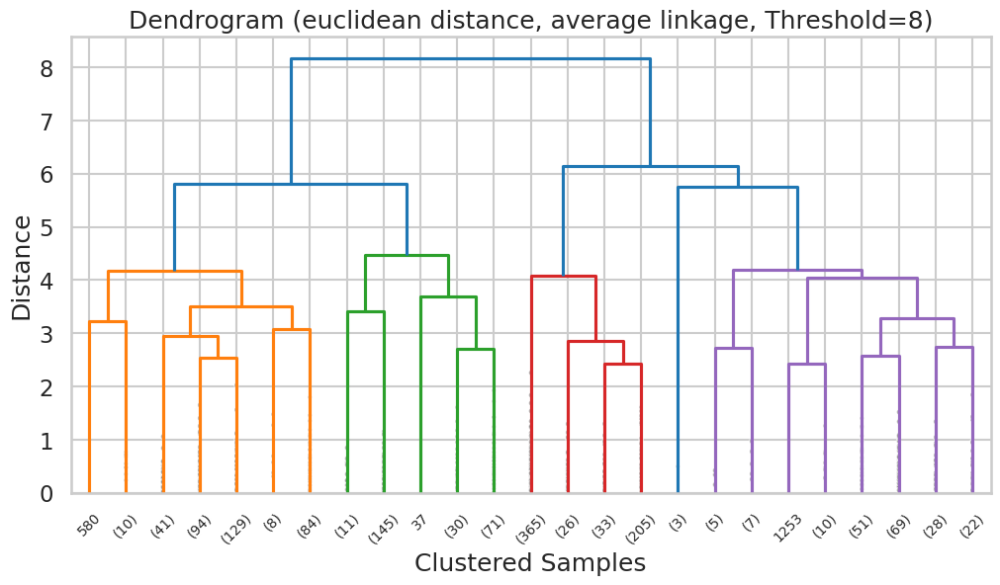

In [ ]:
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering

# Best Agglomerative Clustering Configuration
best_affinity = 'euclidean'
best_linkage = 'average'
best_threshold = 8  # From silhouette score analysis

# Compute linkage matrix for hierarchical clustering
Z = linkage(X, method=best_linkage, metric=best_affinity)

# Plot dendrogram
plt.figure(figsize=(12, 6))
dendrogram(Z, truncate_mode='lastp', p=25, leaf_rotation=45, leaf_font_size=10, show_contracted=True)
plt.title(f"Dendrogram ({best_affinity} distance, {best_linkage} linkage, Threshold={best_threshold})")
plt.xlabel("Clustered Samples")
plt.ylabel("Distance")
plt.show()


### DBScan
* Use DBScan function to  to cluster the above data.
* In the  DBscan change the following parameters:
    * EPS (from 0.1 to 3)
    * Min_samples (from 5 to 25)
    * Another option: Lookup K-Distance graph method
* Plot the silhouette_score versus the variation in the EPS and the min_samples.
* Plot the resulting Clusters in this case.
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques.
* Record your observations and comments.

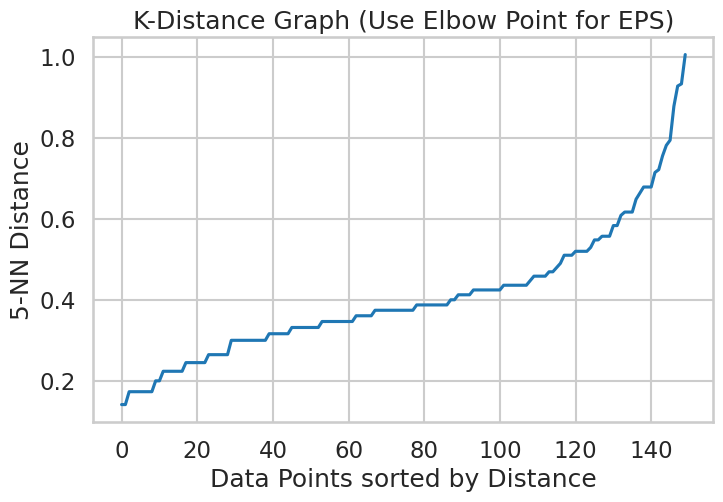

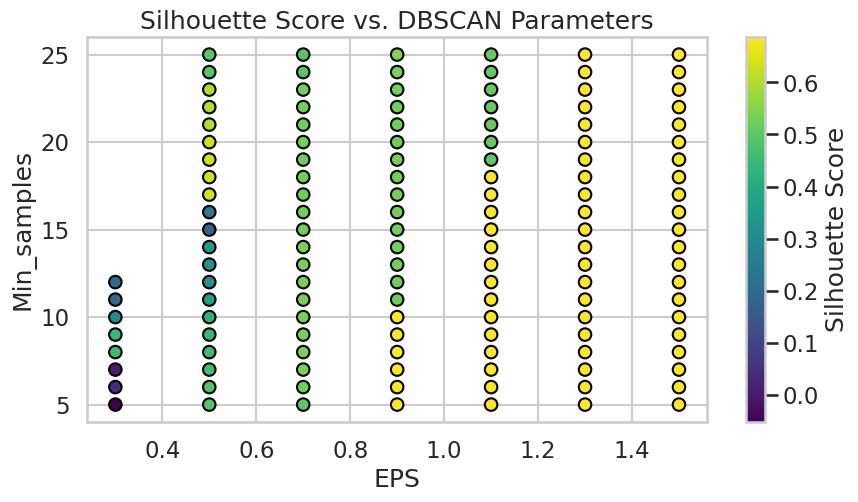

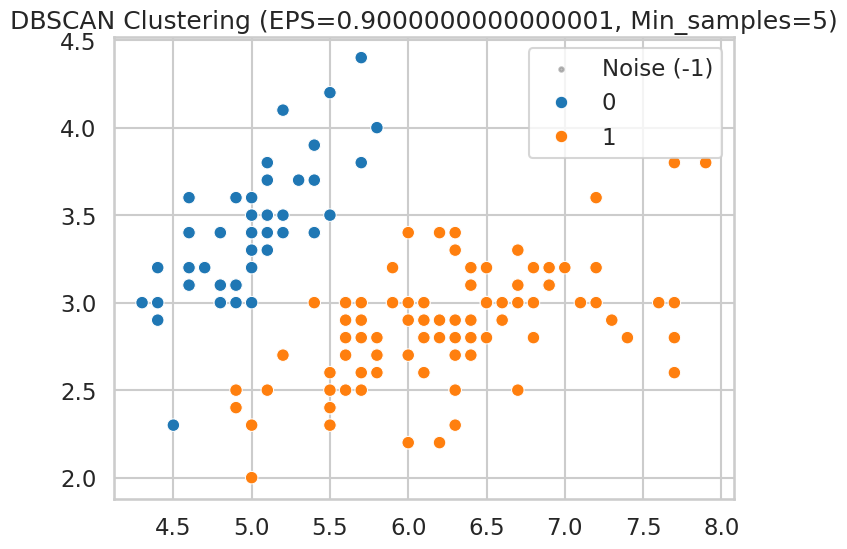


Best DBSCAN Parameters: EPS=0.9000000000000001, Min_samples=5
Best Silhouette Score: 0.6867


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.neighbors import NearestNeighbors

# 1. K-Distance Graph Method (to determine EPS)
nearest_neighbors = NearestNeighbors(n_neighbors=5)
nearest_neighbors.fit(X)
distances, indices = nearest_neighbors.kneighbors(X)

# Sort and plot k-distance graph
distances = np.sort(distances[:, -1])
plt.figure(figsize=(8, 5))
plt.plot(distances)
plt.xlabel("Data Points sorted by Distance")
plt.ylabel("5-NN Distance")
plt.title("K-Distance Graph (Use Elbow Point for EPS)")
plt.show()

# 2. Iterate over different values of EPS and Min_samples
eps_values = np.arange(0.1, 3.1, 0.2)
min_samples_values = range(5, 26)
best_score = -1
best_params = None
silhouette_scores_dbscan = {}

for eps in eps_values:
    for min_samples in min_samples_values:
        try:
            dbscan = DBSCAN(eps=eps, min_samples=min_samples)
            labels = dbscan.fit_predict(X)

            # Ignore silhouette score if all points are in one cluster or noise
            if len(set(labels)) <= 1:
                continue

            sil_score = silhouette_score(X, labels)
            silhouette_scores_dbscan[(eps, min_samples)] = sil_score

            # Track the best parameters
            if sil_score > best_score:
                best_score = sil_score
                best_params = (eps, min_samples)
                best_labels = labels

        except Exception as e:
            print(f"Skipping EPS={eps}, Min_samples={min_samples} due to error: {e}")

# 3. Plot Silhouette Score vs. EPS & Min_samples
plt.figure(figsize=(10, 5))
x_vals, y_vals, z_vals = zip(*[(eps, min_samples, score) for (eps, min_samples), score in silhouette_scores_dbscan.items()])
sc = plt.scatter(x_vals, y_vals, c=z_vals, cmap='viridis', edgecolor='k')
plt.colorbar(sc, label="Silhouette Score")
plt.xlabel("EPS")
plt.ylabel("Min_samples")
plt.title("Silhouette Score vs. DBSCAN Parameters")
plt.show()

# 4. Apply DBSCAN with Best Parameters & Plot Clusters
best_eps, best_min_samples = best_params
dbscan_best = DBSCAN(eps=best_eps, min_samples=best_min_samples)
final_labels = dbscan_best.fit_predict(X)

# Extract noise and cluster points
noise_mask = final_labels == -1
clusters_mask = final_labels != -1

plt.figure(figsize=(8, 6))

# Plot noise points in gray
plt.scatter(X[noise_mask, 0], X[noise_mask, 1], c='gray', label='Noise (-1)', alpha=0.5, s=10)

# Plot clusters, ensuring unique colors
unique_labels = np.unique(final_labels[clusters_mask])  # Exclude noise (-1)
palette = sns.color_palette("tab10", len(unique_labels))

sns.scatterplot(
    x=X[clusters_mask, 0],
    y=X[clusters_mask, 1],
    hue=final_labels[clusters_mask],
    palette=palette,
    legend="full"
)

plt.title(f"DBSCAN Clustering (EPS={best_eps}, Min_samples={best_min_samples})")
plt.legend()
plt.show()

# Store the best silhouette score for comparison
clustering_scores['DBSCAN_Best'] = best_score

# Print Best Parameters
print(f"\nBest DBSCAN Parameters: EPS={best_eps}, Min_samples={best_min_samples}")
print(f"Best Silhouette Score: {best_score:.4f}")


Best Performing Algorithm: DBSCAN appears to be the most effective clustering algorithm for this dataset, as it achieved a substantially higher Silhouette Score (0.6867) compared to K-Means (0.4862) and Hierarchical Clustering (0.4717). This suggests that DBSCAN found more distinct and well-separated clusters.

## iris data set
The iris data set is test data set that is part of the Sklearn module
which contains 150 records each with 4 features. All the features are represented by real numbers.

The data represents three classes.


In [ ]:
from sklearn.datasets import load_iris
iris_data = load_iris()
iris_data.target[[10, 25, 50]]
#array([0, 0, 1])
list(iris_data.target_names)
['setosa', 'versicolor', 'virginica']


['setosa', 'versicolor', 'virginica']

* Repeat all the above clustering approaches and steps on the above data.
* Comment on the effect of scaling on clustering this dataset. Show the difference between clustering the data with and without   scaling.
* Compare between the different clustering approaches.
* Is your clustering outcome consistent with the labels?

K-Means before scaling

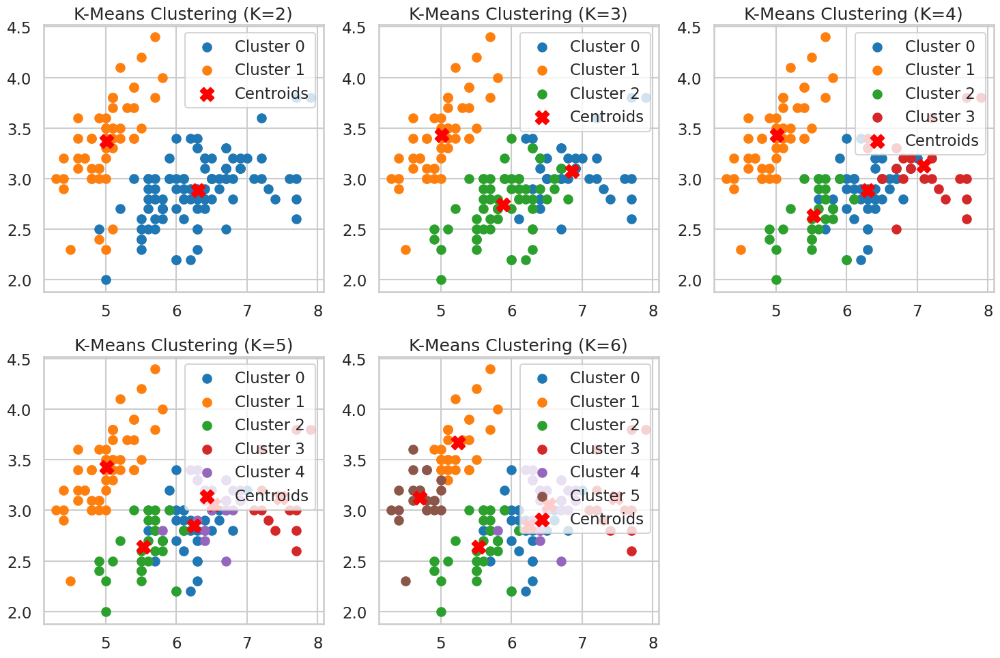

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.datasets import load_iris
from sklearn.preprocessing import StandardScaler

# Load Iris dataset
iris_data = load_iris()
X = iris_data.data
y = iris_data.target

# Define K values to test
K_values = [2, 3, 4, 5, 6]

# Set plot style
sns.set_style("whitegrid")
plt.figure(figsize=(15, 10))

# Apply K-Means for each K and plot results
for i, k in enumerate(K_values, 1):
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
    labels = kmeans.fit_predict(X)

    plt.subplot(2, 3, i)  # Create subplots
    for j in range(k):
        plt.scatter(X[labels == j, 0], X[labels == j, 1], label=f'Cluster {j}')

    # Plot centroids
    plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1],
                c='red', marker='X', s=200, label='Centroids')

    plt.title(f'K-Means Clustering (K={k})')
    plt.legend()

plt.tight_layout()
plt.show()


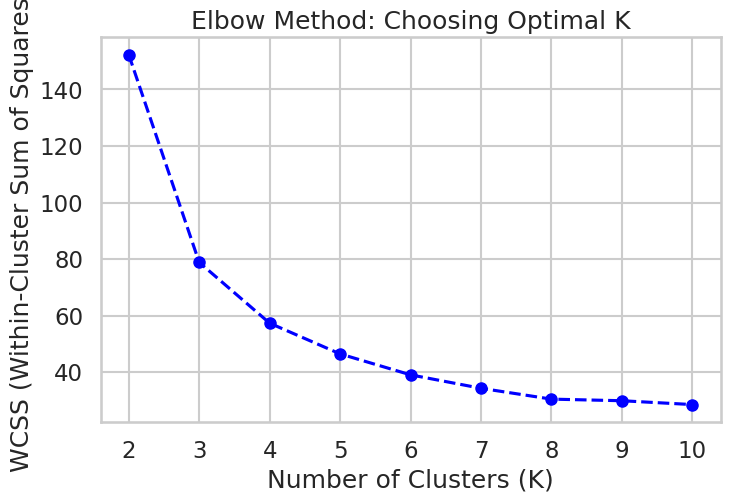

In [ ]:
# Compute WCSS (Within-Cluster Sum of Squares) for each K
wcss = []  # Store WCSS values

for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)  # Store distortion score (WCSS)

# Plot Elbow Method
plt.figure(figsize=(8,5))
plt.plot(range(2, 11), wcss, marker='o', linestyle='--', color='b', markersize=8)
plt.xlabel('Number of Clusters (K)')
plt.ylabel('WCSS (Within-Cluster Sum of Squares)')
plt.title('Elbow Method: Choosing Optimal K')
plt.xticks(range(2, 11))
plt.grid(True)
plt.show()


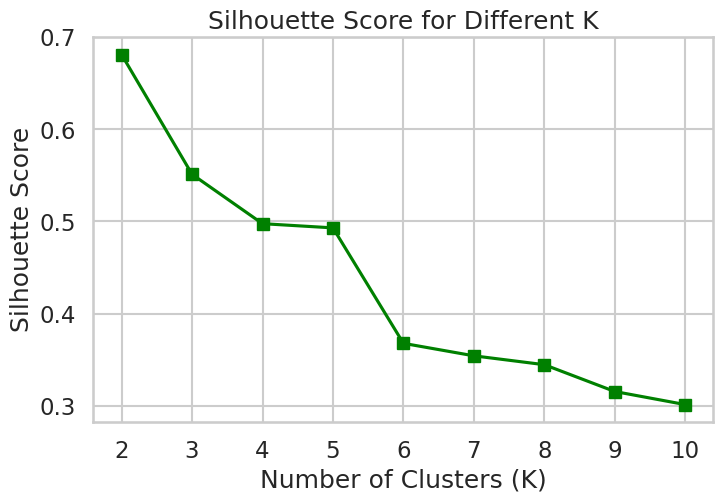

Best K based on Silhouette Score: 2 with Score: 0.6810


In [ ]:
from sklearn.metrics import silhouette_score

sil_scores = []

for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
    labels = kmeans.fit_predict(X)
    sil_scores.append(silhouette_score(X, labels))  # Compute Silhouette Score

# Plot Silhouette Score vs. K
plt.figure(figsize=(8,5))
plt.plot(range(2, 11), sil_scores, marker='s', linestyle='-', color='g', markersize=8)
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for Different K')
plt.xticks(range(2, 11))
plt.grid(True)
plt.show()

# Best K based on silhouette score
best_silhouette = max(sil_scores)

print(f"Best K based on Silhouette Score: {best_K} with Score: {best_silhouette:.4f}")



K-Means after scaling

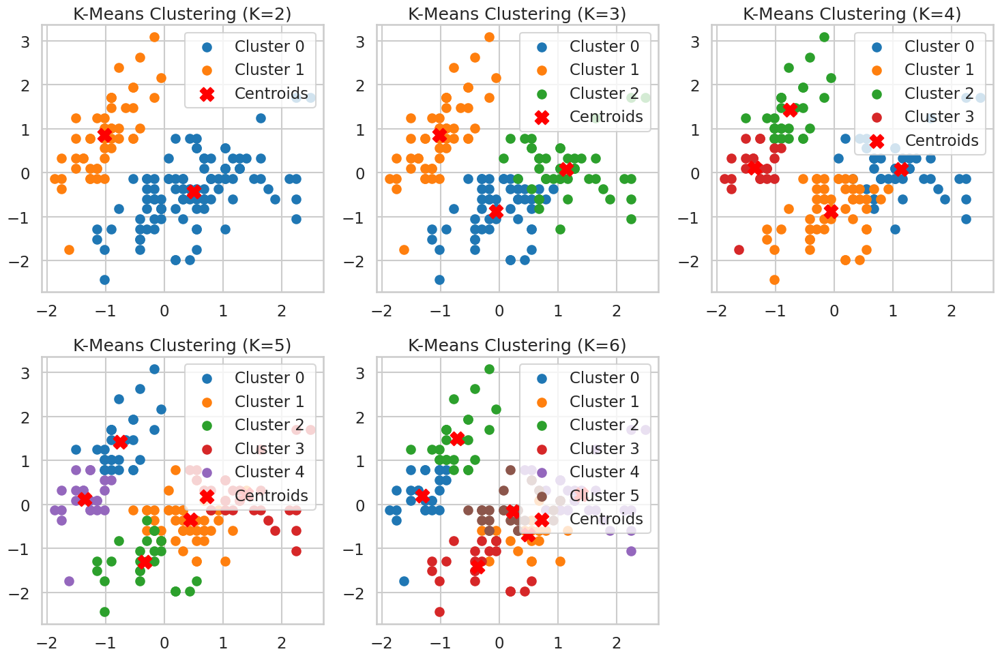

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.datasets import load_iris
from sklearn.preprocessing import StandardScaler

# Load Iris dataset
iris_data = load_iris()
X = iris_data.data
y = iris_data.target

# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Define K values to test
K_values = [2, 3, 4, 5, 6]

# Set plot style
sns.set_style("whitegrid")
plt.figure(figsize=(15, 10))

# Apply K-Means for each K and plot results
for i, k in enumerate(K_values, 1):
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42, n_init=10)
    labels = kmeans.fit_predict(X_scaled)

    plt.subplot(2, 3, i)  # Create subplots
    for j in range(k):
        plt.scatter(X_scaled[labels == j, 0], X_scaled[labels == j, 1], label=f'Cluster {j}')

    # Plot centroids
    plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1],
                c='red', marker='X', s=200, label='Centroids')

    plt.title(f'K-Means Clustering (K={k})')
    plt.legend()

plt.tight_layout()
plt.show()


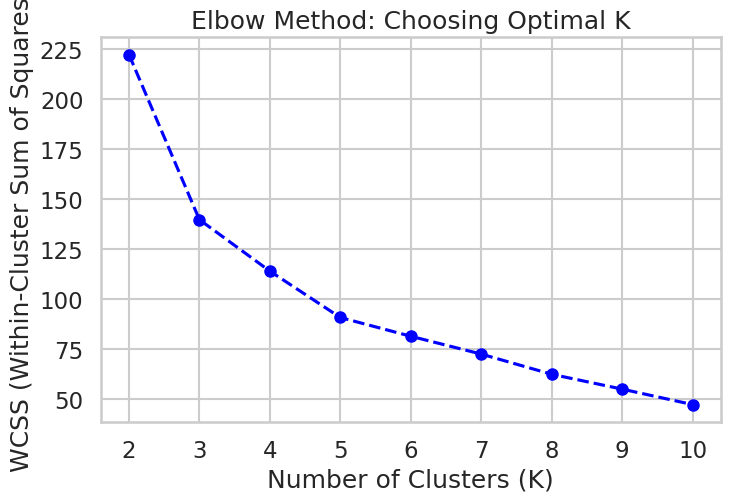

In [ ]:
# Compute WCSS (Within-Cluster Sum of Squares) for each K
wcss = []  # Store WCSS values

for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42, n_init=10)
    kmeans.fit(X_scaled)
    wcss.append(kmeans.inertia_)  # Store distortion score (WCSS)

# Plot Elbow Method
plt.figure(figsize=(8,5))
plt.plot(range(2, 11), wcss, marker='o', linestyle='--', color='b', markersize=8)
plt.xlabel('Number of Clusters (K)')
plt.ylabel('WCSS (Within-Cluster Sum of Squares)')
plt.title('Elbow Method: Choosing Optimal K')
plt.xticks(range(2, 11))
plt.grid(True)
plt.show()


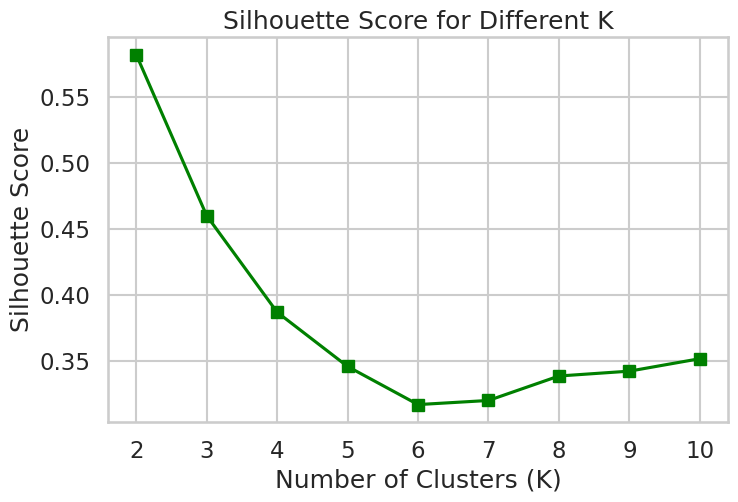

Best K based on Silhouette Score: 2 with Score: 0.5818


In [ ]:
from sklearn.metrics import silhouette_score

sil_scores = []
best_K = 2  # Initialize with the smallest K

for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42, n_init=10)
    labels = kmeans.fit_predict(X_scaled)
    score = silhouette_score(X_scaled, labels)
    sil_scores.append(score)

    # Track best K
    if score == max(sil_scores):
        best_K = k

# Plot Silhouette Score vs. K
plt.figure(figsize=(8,5))
plt.plot(range(2, 11), sil_scores, marker='s', linestyle='-', color='g', markersize=8)
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for Different K')
plt.xticks(range(2, 11))
plt.grid(True)
plt.show()

# Print best K
print(f"Best K based on Silhouette Score: {best_K} with Score: {max(sil_scores):.4f}")


  Heirarchal without scaling vs with scaling


--- Agglomerative Clustering Without Scaling ---


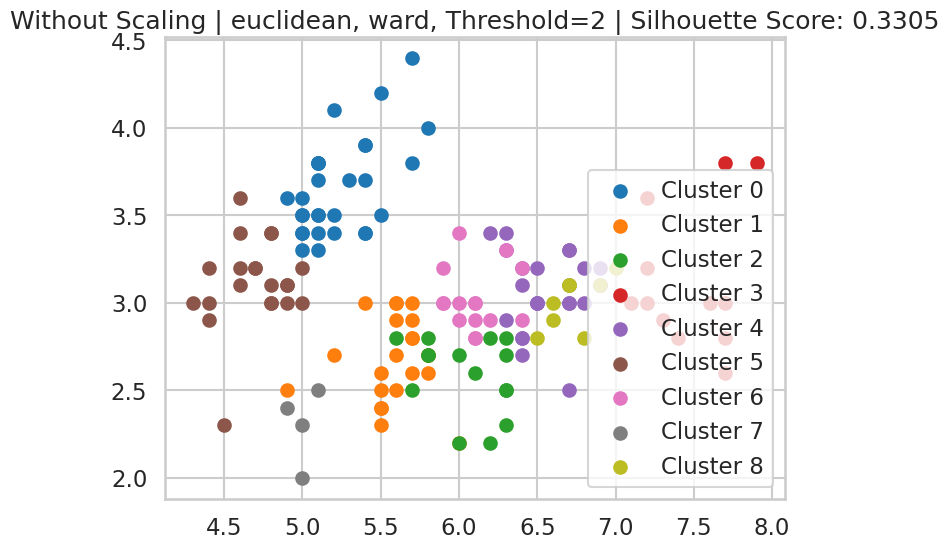

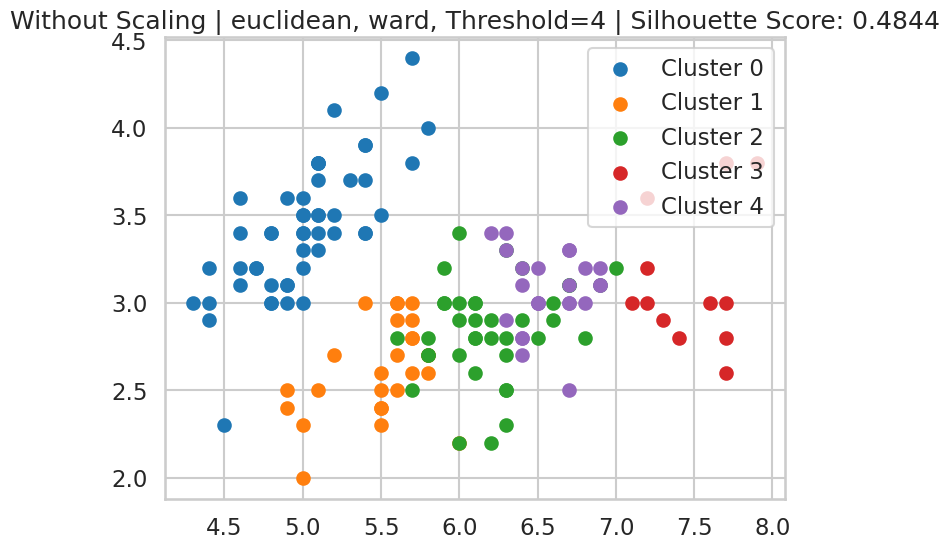

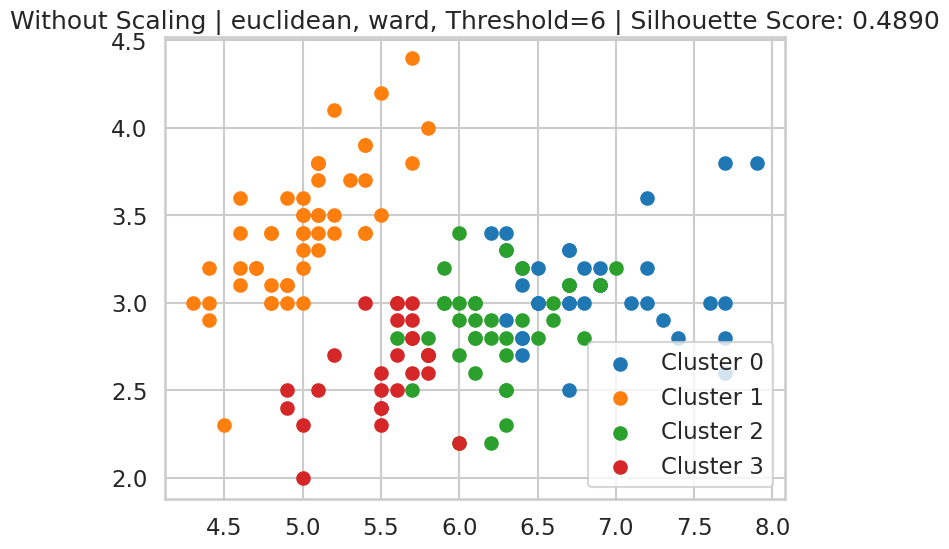

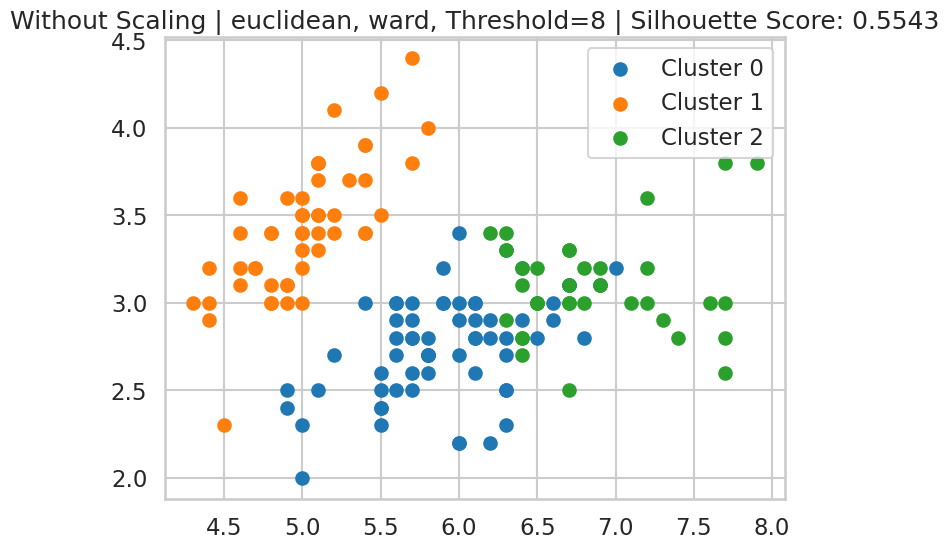

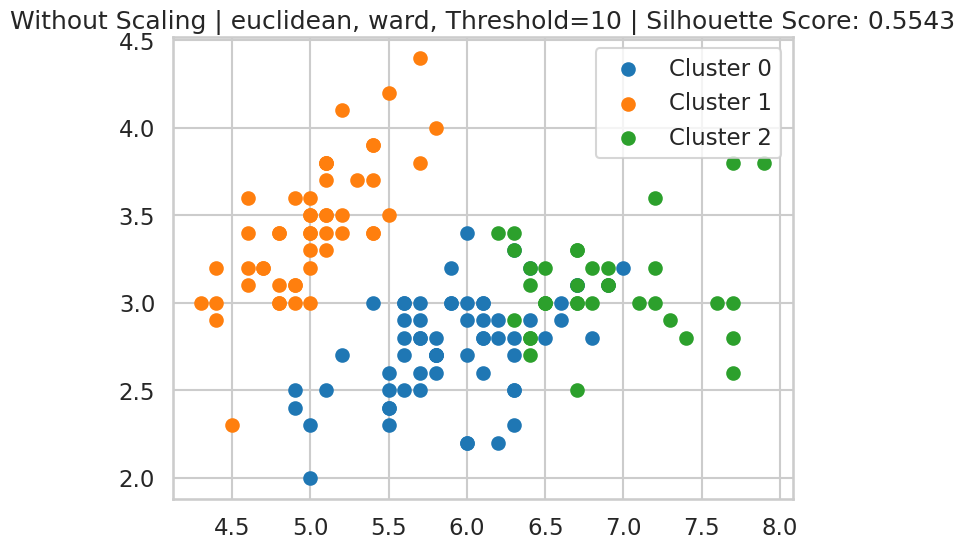

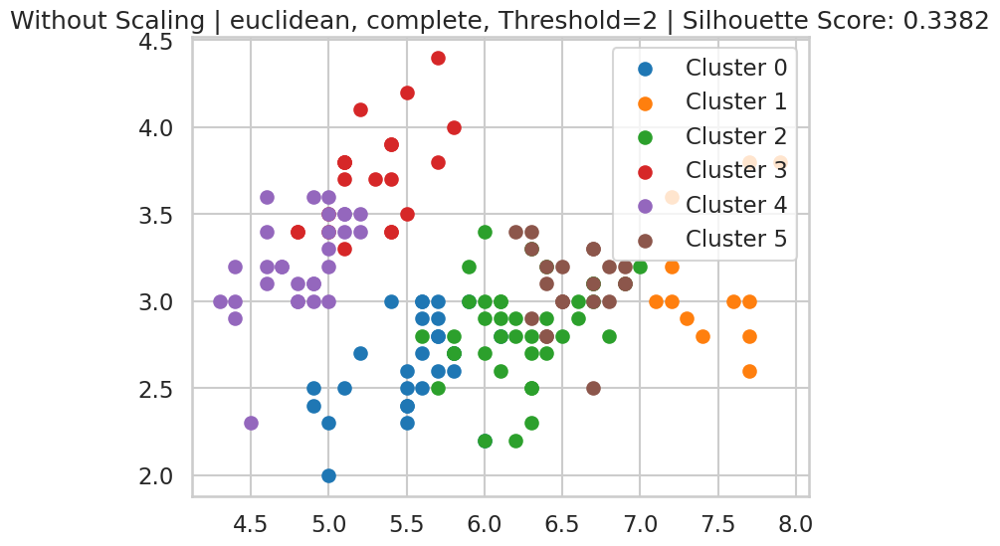

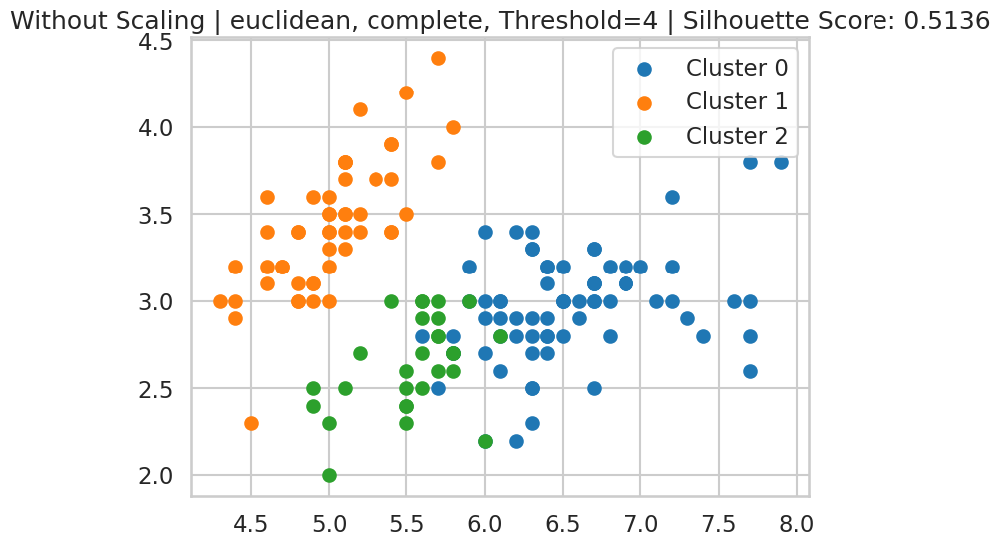

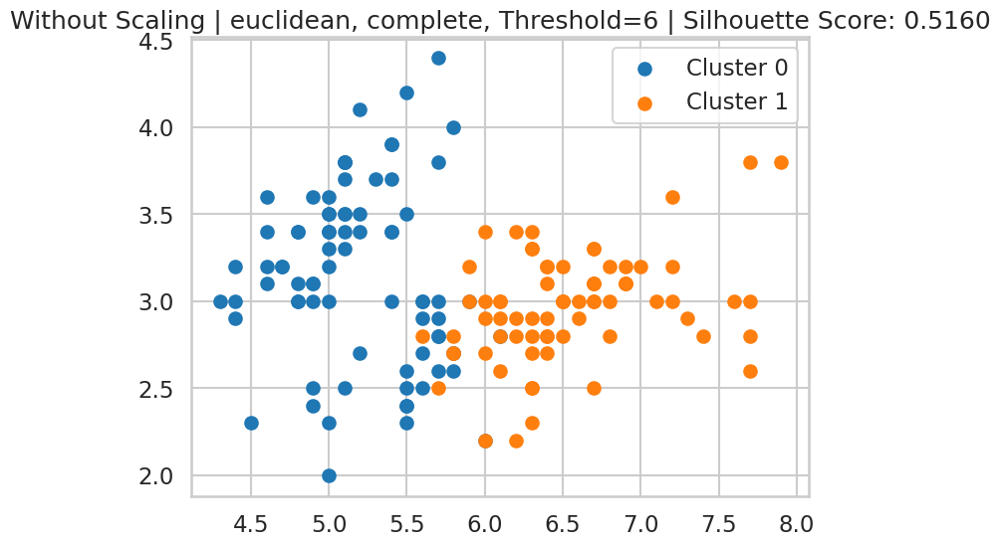

Error with configuration euclidean, complete, Threshold=8: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Error with configuration euclidean, complete, Threshold=10: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)


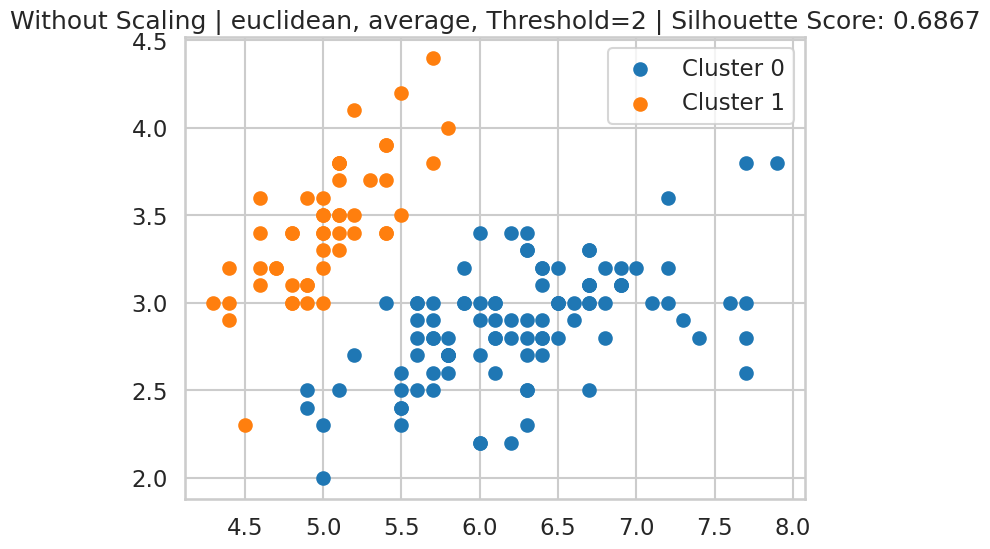

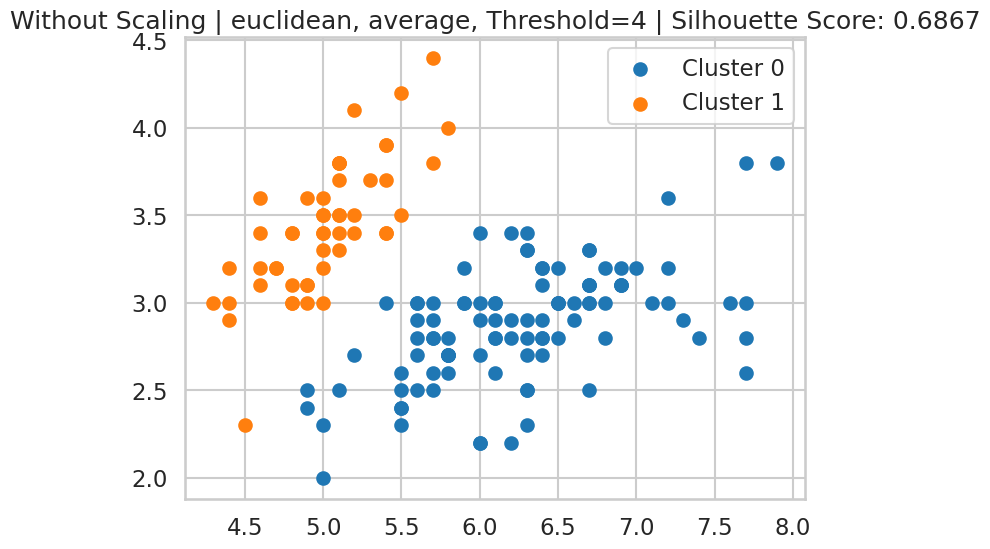

Error with configuration euclidean, average, Threshold=6: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Error with configuration euclidean, average, Threshold=8: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Error with configuration euclidean, average, Threshold=10: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Error with configuration euclidean, single, Threshold=2: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Error with configuration euclidean, single, Threshold=4: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Error with configuration euclidean, single, Threshold=6: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Error with configuration euclidean, single, Threshold=8: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Error with configuration euclidean, single, Threshold=10: Number of labels is 1. Valid values are 2 

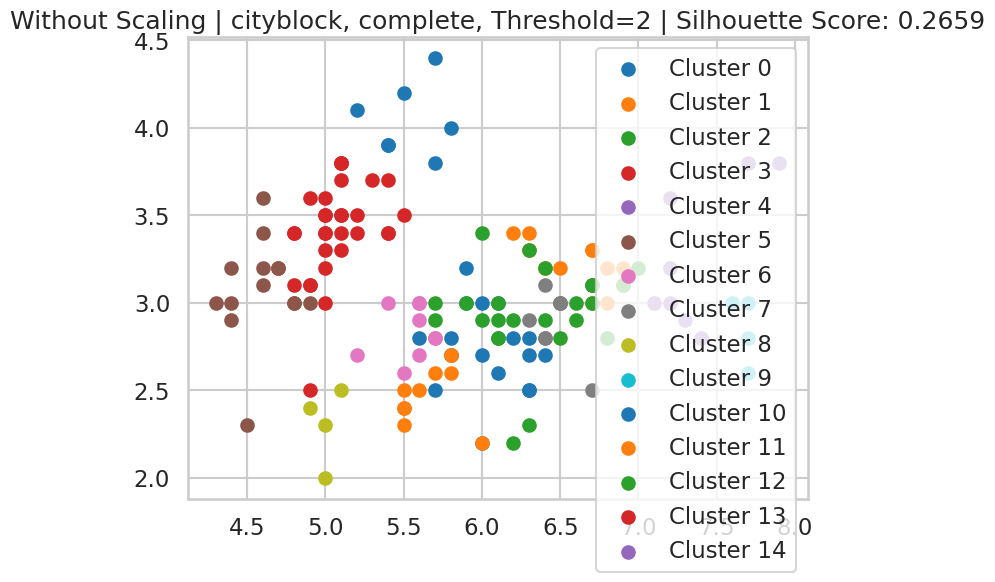

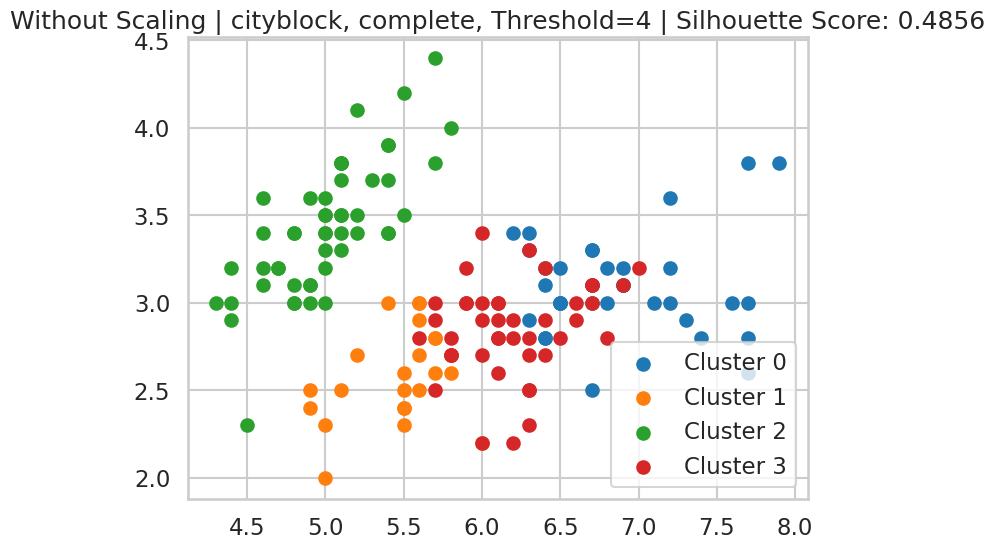

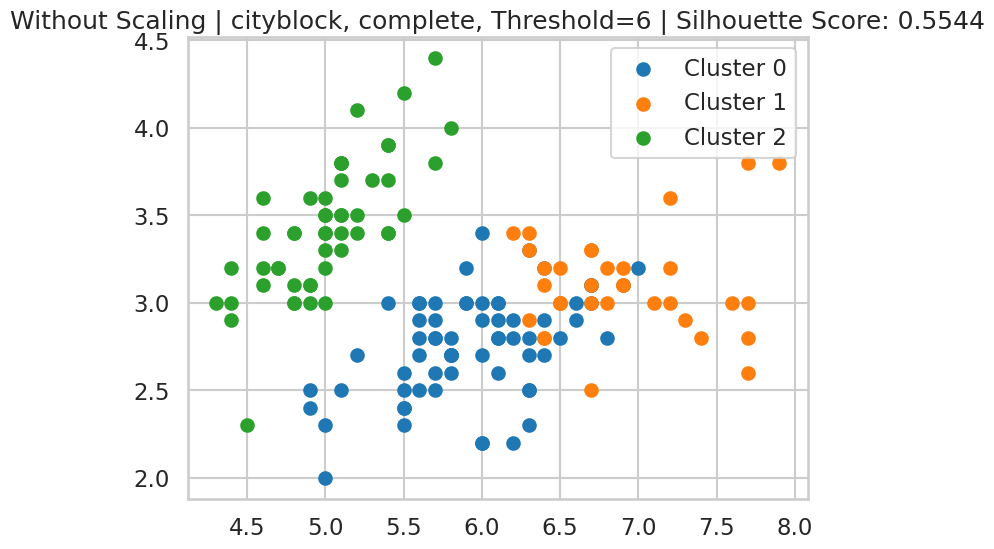

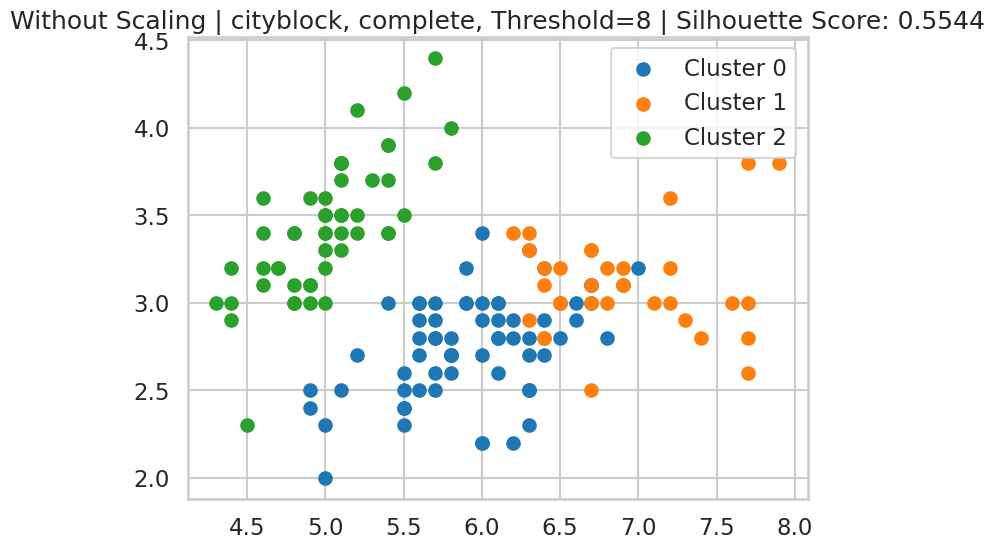

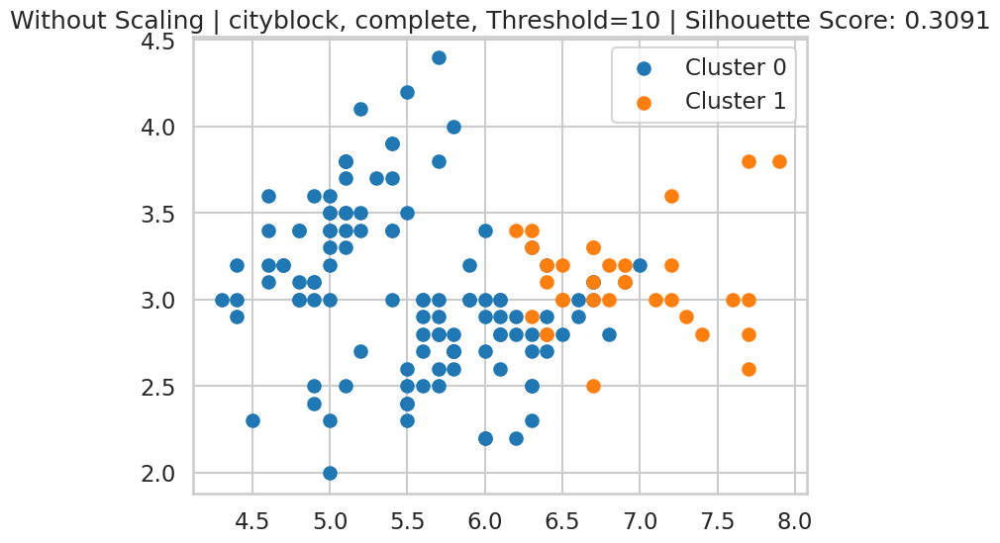

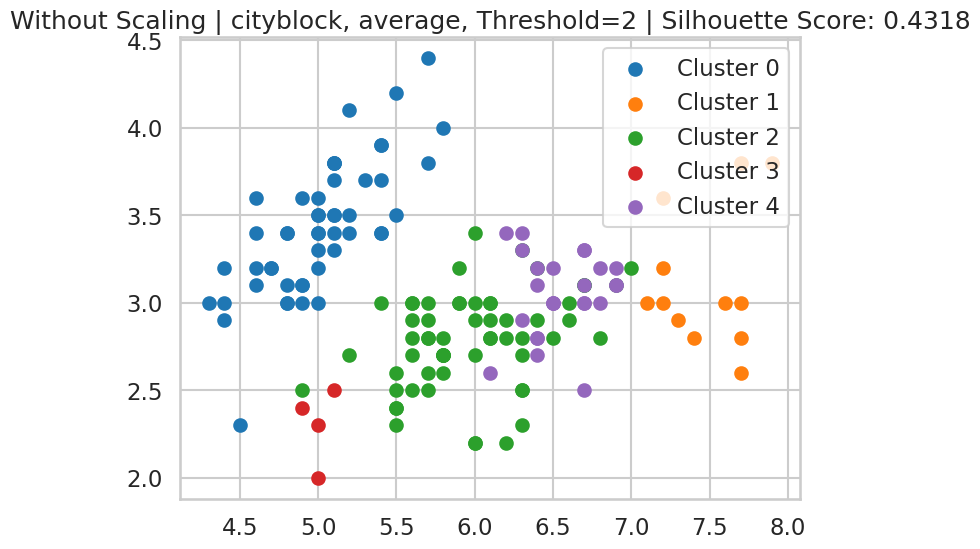

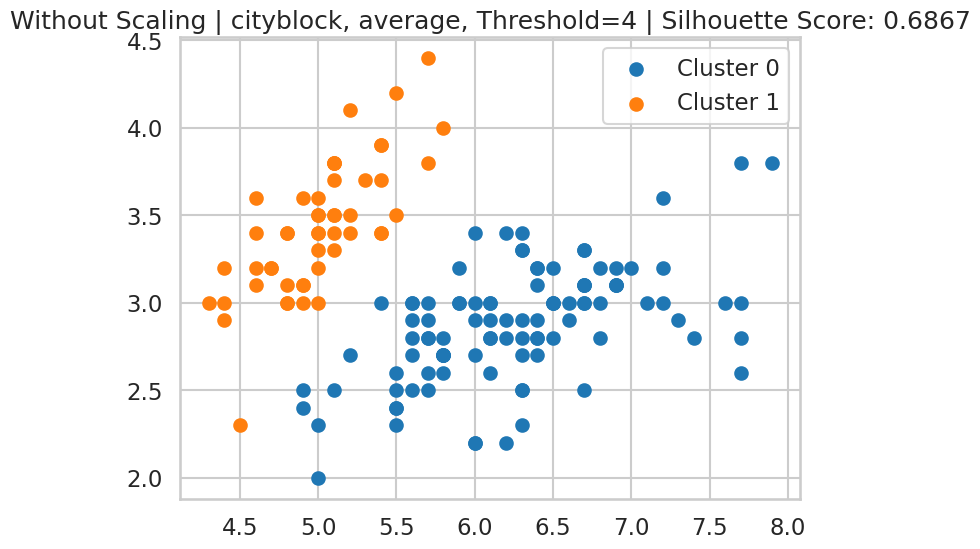

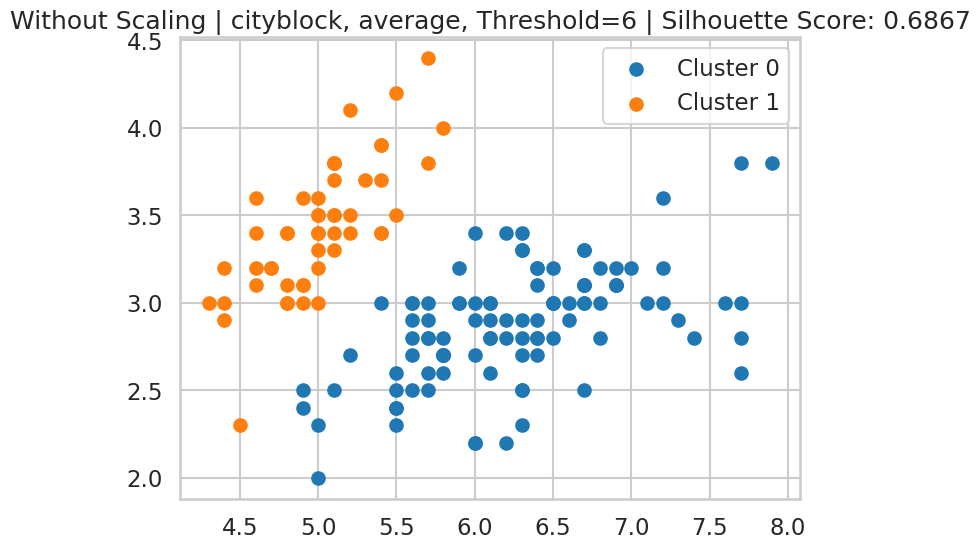

Error with configuration cityblock, average, Threshold=8: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Error with configuration cityblock, average, Threshold=10: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)


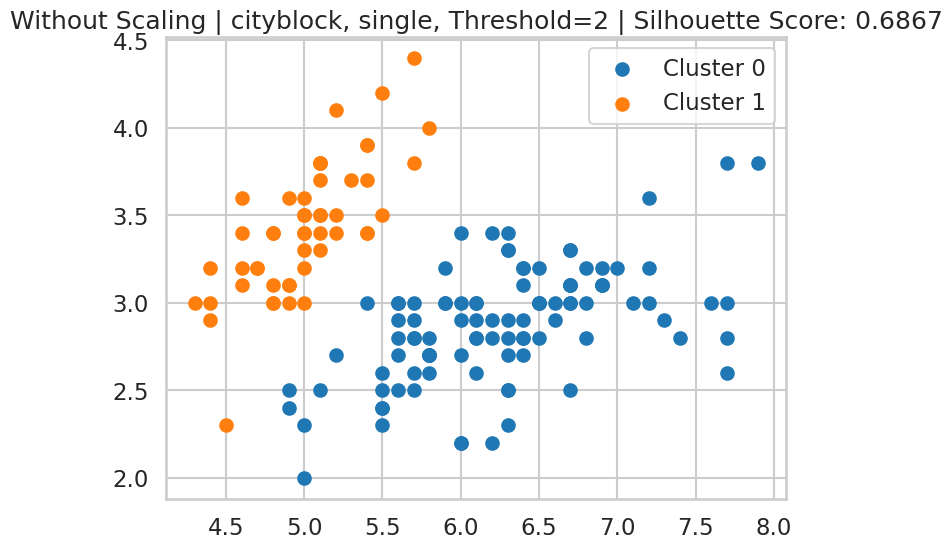

Error with configuration cityblock, single, Threshold=4: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Error with configuration cityblock, single, Threshold=6: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Error with configuration cityblock, single, Threshold=8: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Error with configuration cityblock, single, Threshold=10: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Error with configuration cosine, complete, Threshold=2: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Error with configuration cosine, complete, Threshold=4: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Error with configuration cosine, complete, Threshold=6: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Error with configuration cosine, complete, Threshold=8: Number of labels is 1. Valid values are 2 to n_sam

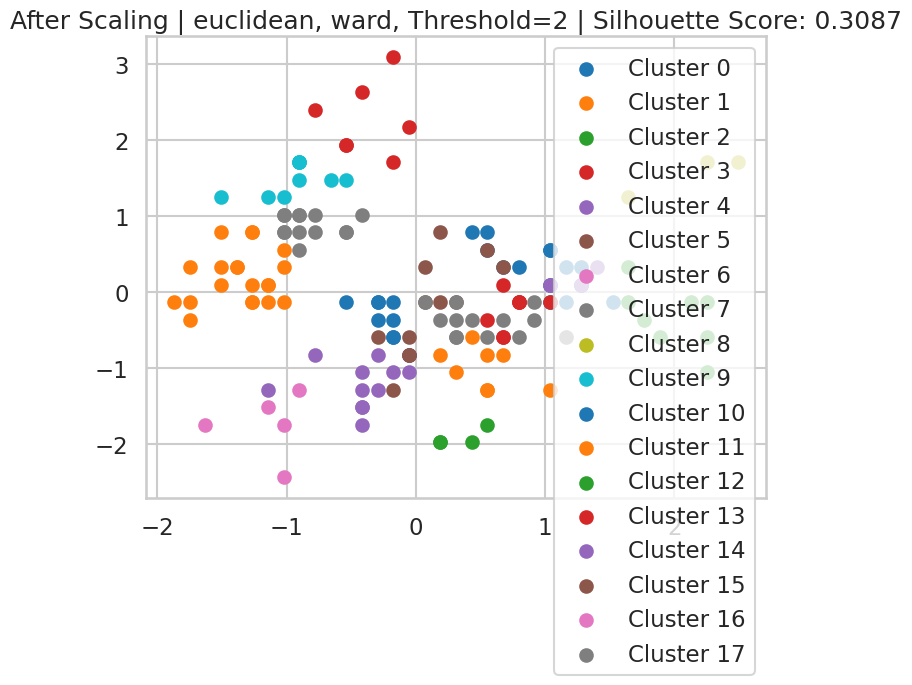

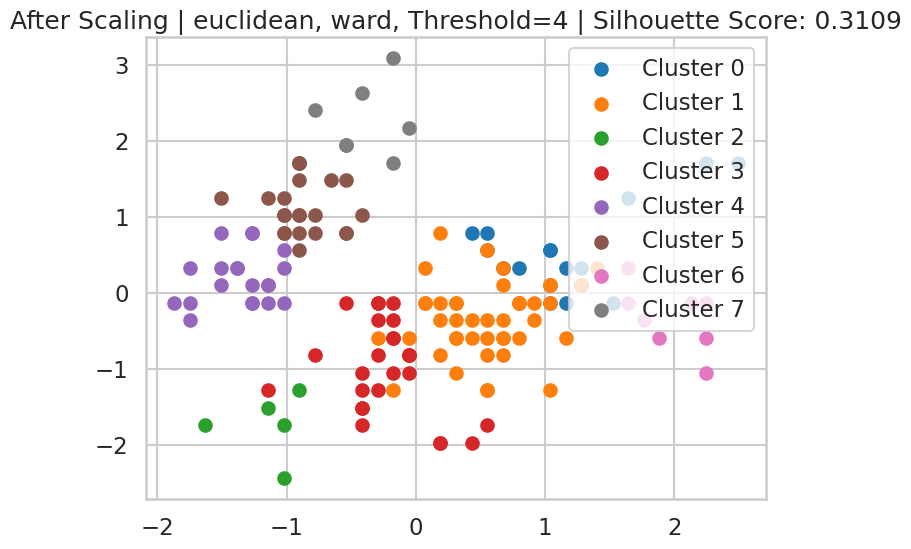

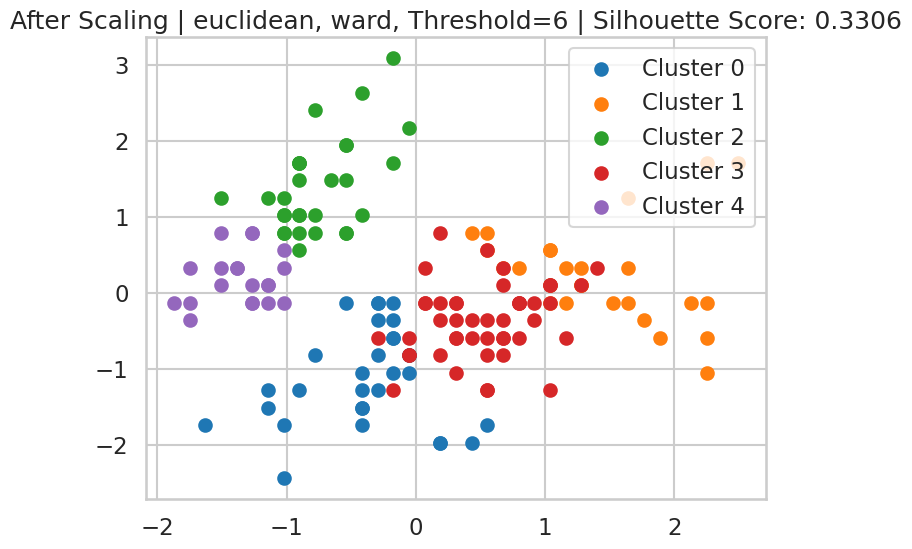

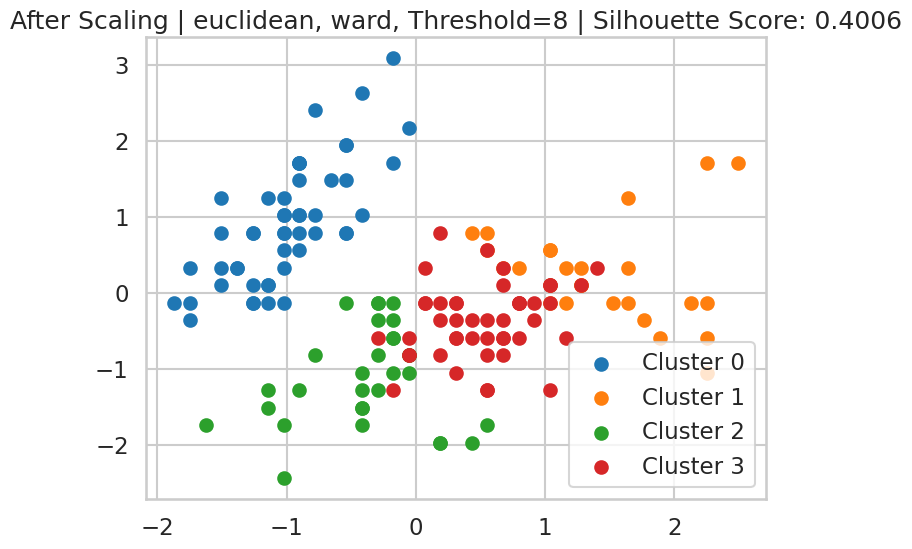

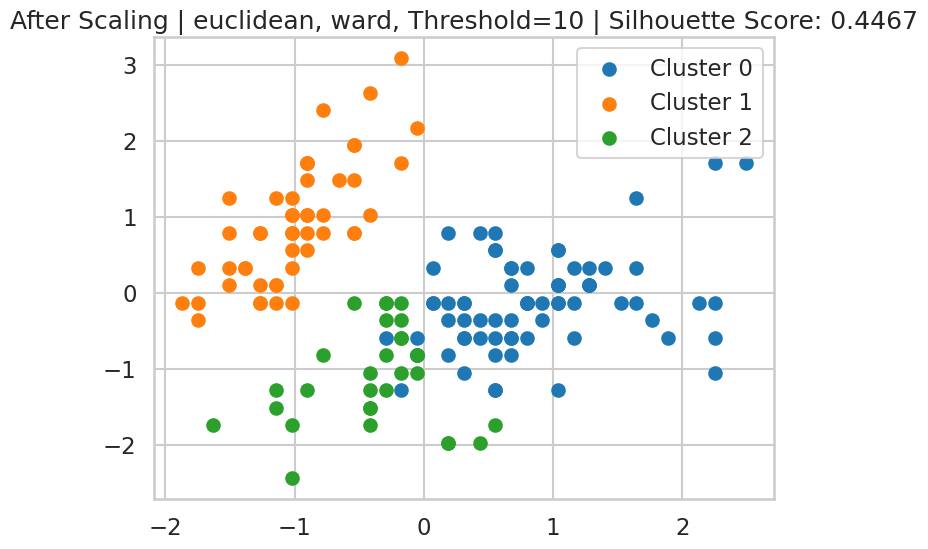

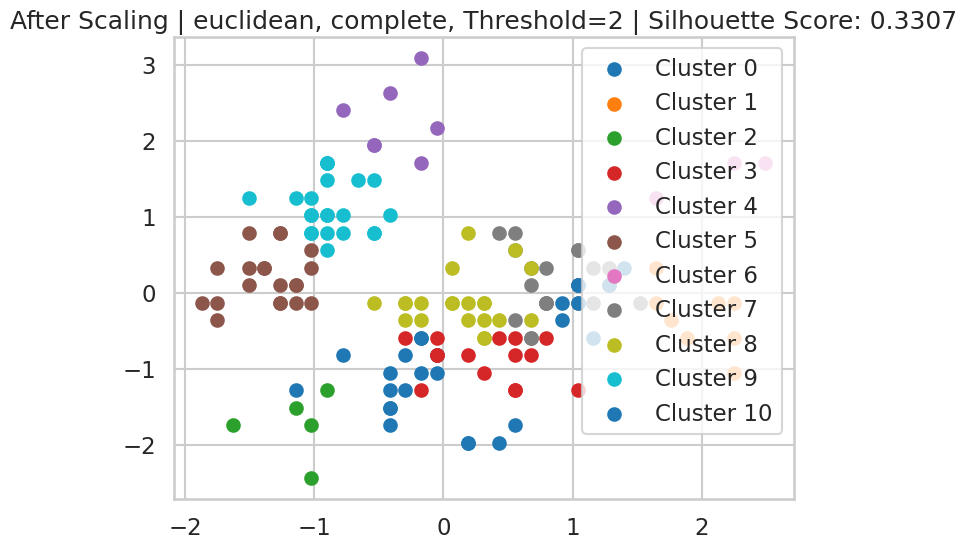

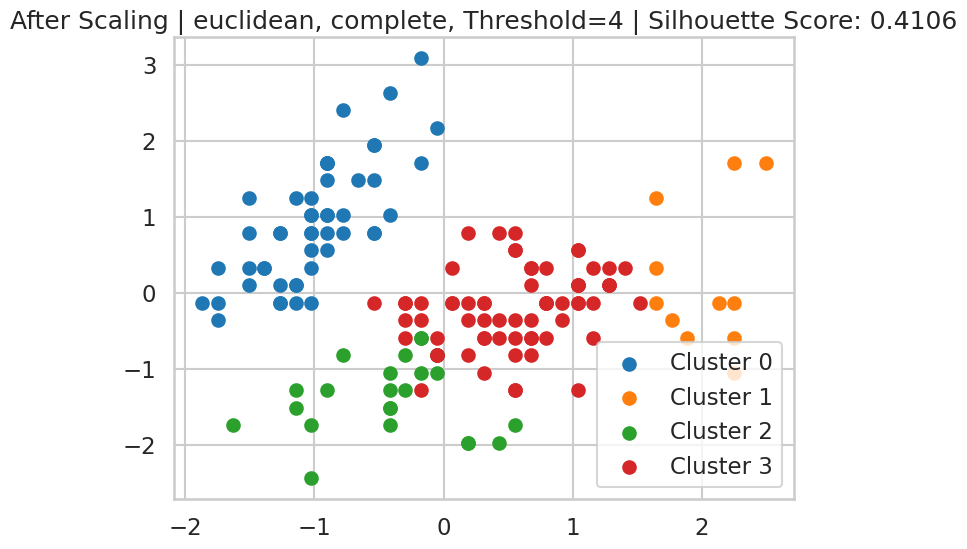

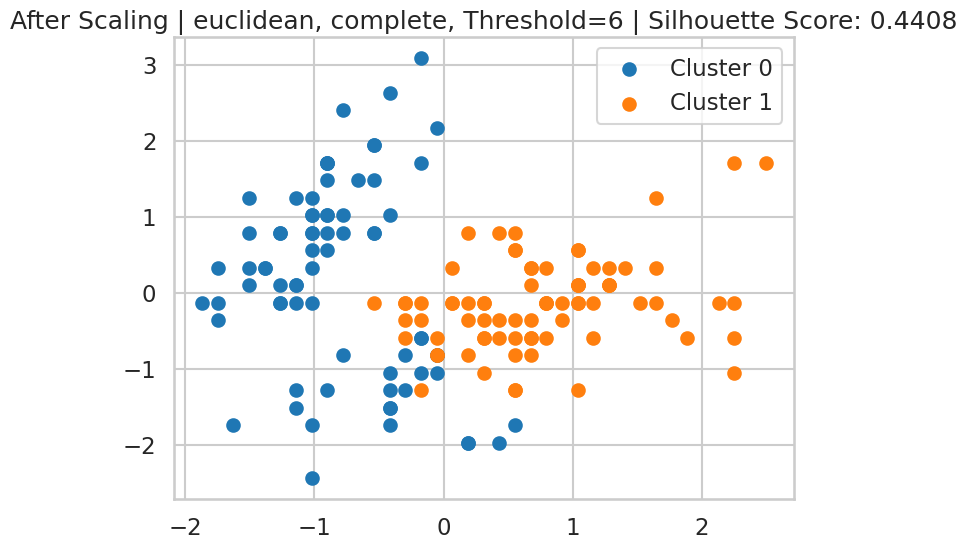

Error with configuration euclidean, complete, Threshold=8: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Error with configuration euclidean, complete, Threshold=10: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)


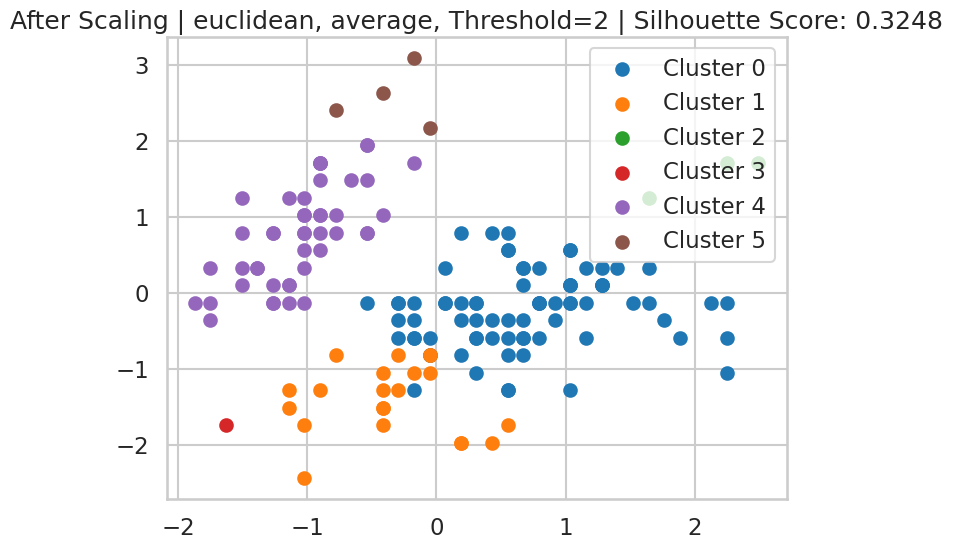

Error with configuration euclidean, average, Threshold=4: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Error with configuration euclidean, average, Threshold=6: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Error with configuration euclidean, average, Threshold=8: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Error with configuration euclidean, average, Threshold=10: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Error with configuration euclidean, single, Threshold=2: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Error with configuration euclidean, single, Threshold=4: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Error with configuration euclidean, single, Threshold=6: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Error with configuration euclidean, single, Threshold=8: Number of labels is 1. Valid values are 2 

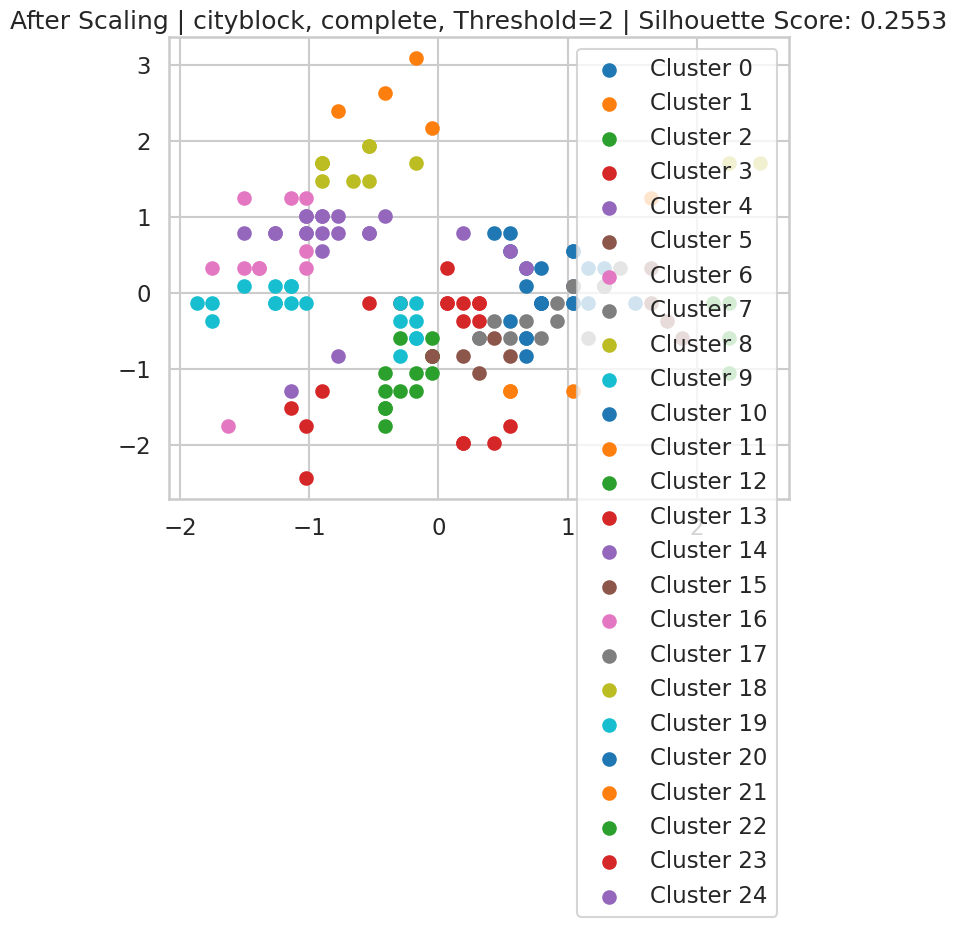

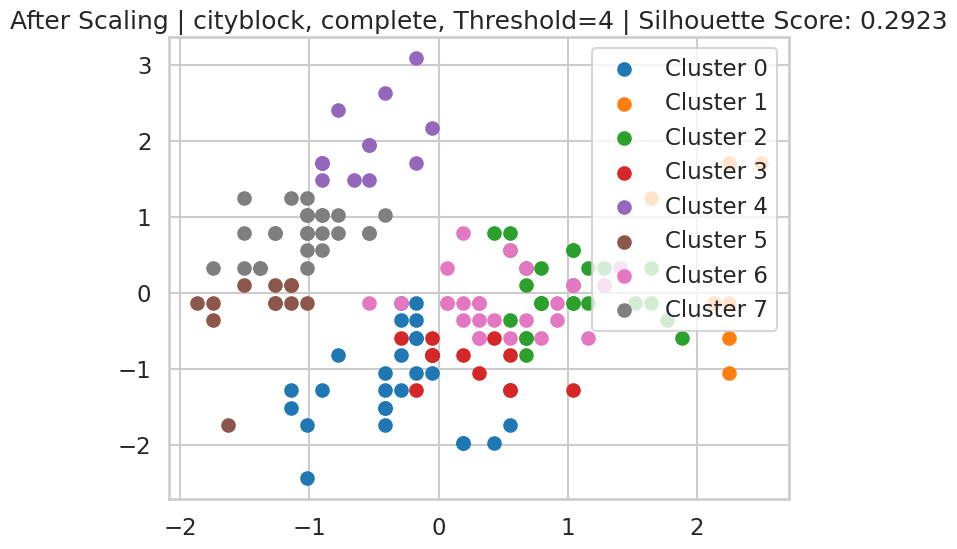

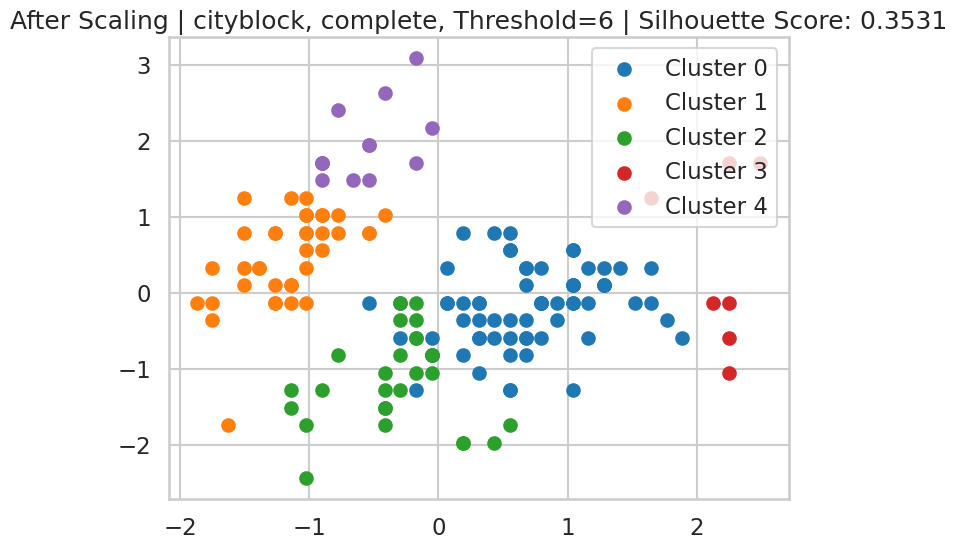

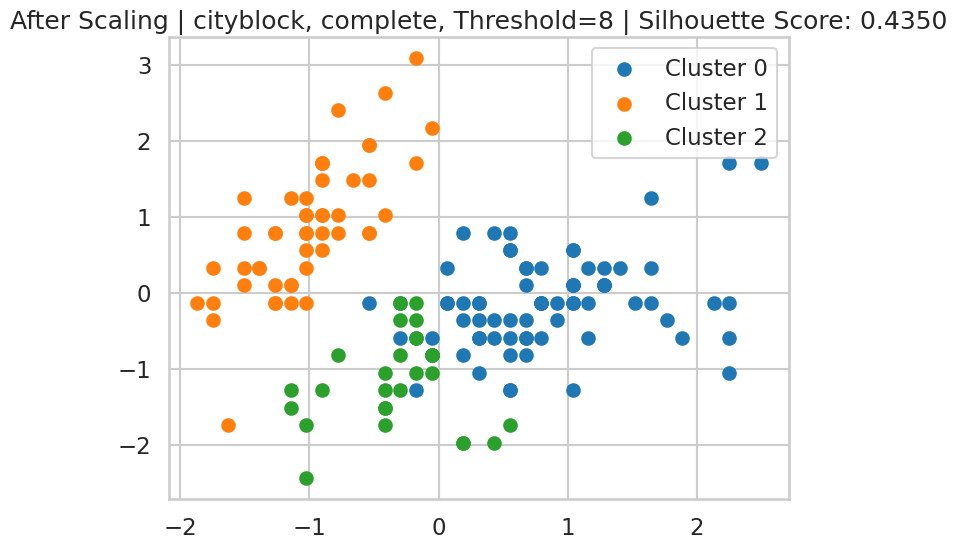

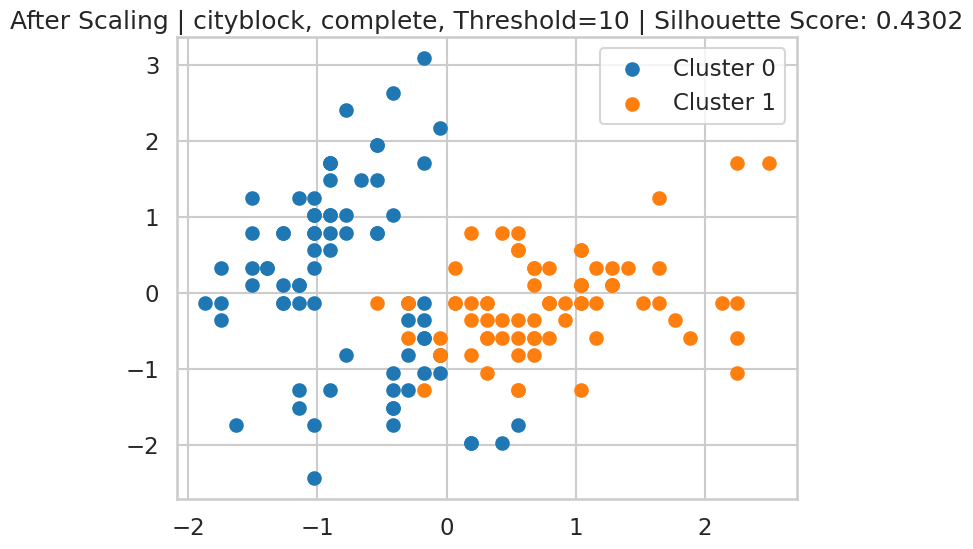

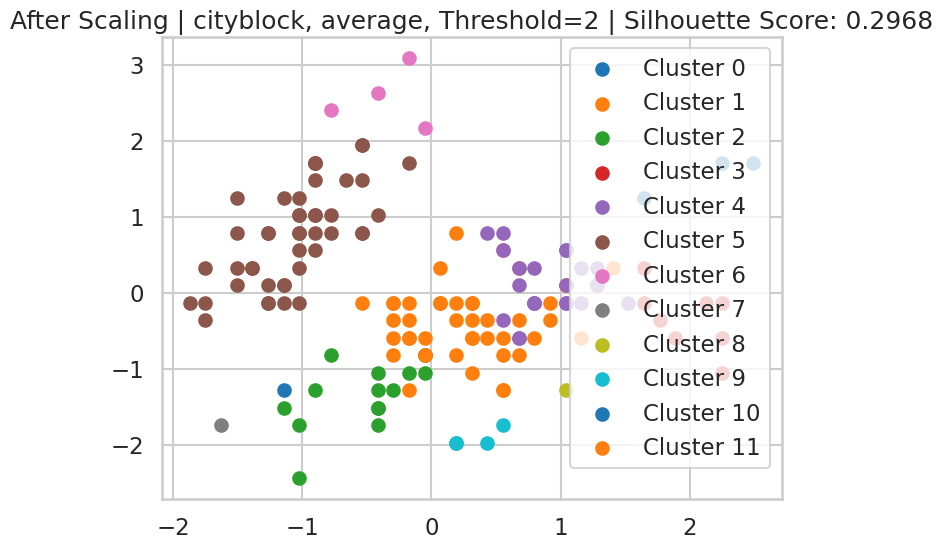

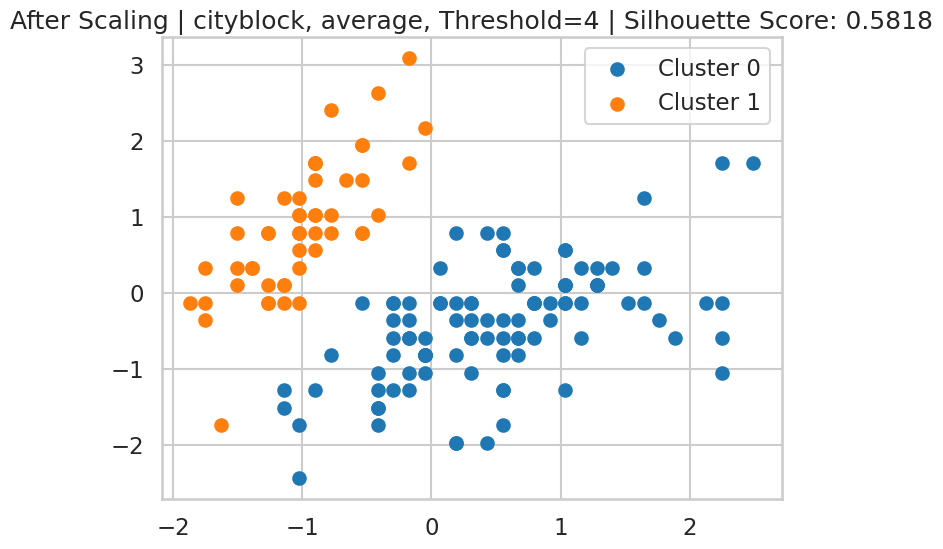

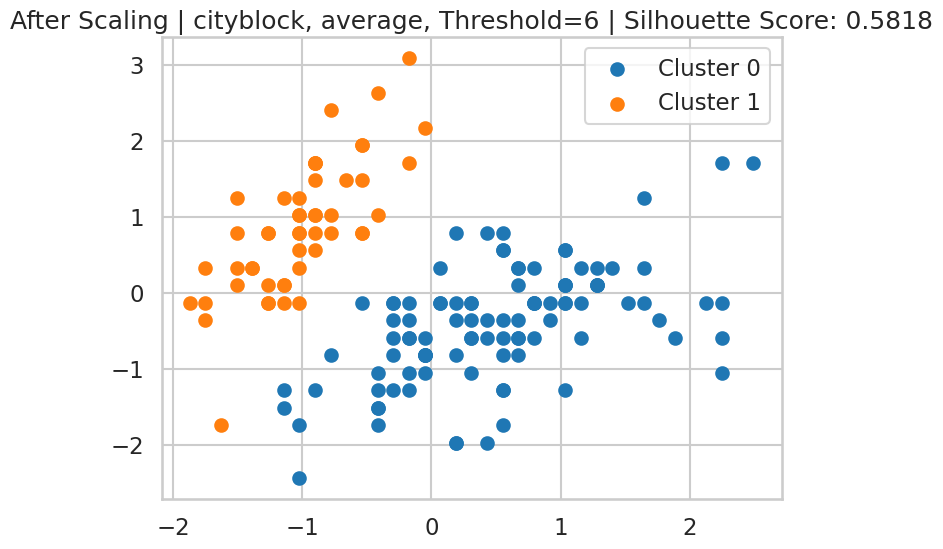

Error with configuration cityblock, average, Threshold=8: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Error with configuration cityblock, average, Threshold=10: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)


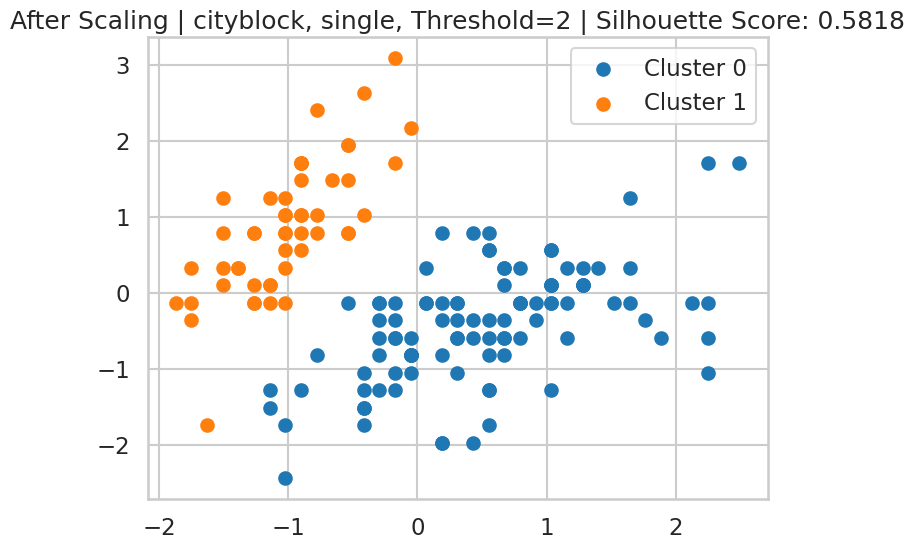

Error with configuration cityblock, single, Threshold=4: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Error with configuration cityblock, single, Threshold=6: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Error with configuration cityblock, single, Threshold=8: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Error with configuration cityblock, single, Threshold=10: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Error with configuration cosine, complete, Threshold=2: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Error with configuration cosine, complete, Threshold=4: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Error with configuration cosine, complete, Threshold=6: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Error with configuration cosine, complete, Threshold=8: Number of labels is 1. Valid values are 2 to n_sam

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from sklearn.datasets import load_iris
from sklearn.preprocessing import StandardScaler

# Load the Iris dataset
iris_data = load_iris()
X = iris_data.data

# Standardize the dataset (for scaling comparison)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Define possible affinities, linkages, and distance thresholds
affinities = ['euclidean', 'cityblock', 'cosine']  # Use 'cityblock' instead of 'manhattan'
linkages = ['ward', 'complete', 'average', 'single']
thresholds = [2, 4, 6, 8, 10]

# Function to apply Agglomerative Clustering and track results
def apply_agg_clustering(X, description):
    best_score = -1
    optimal_params = {}
    agg_results = {}

    for affinity in affinities:
        for linkage in linkages:
            for threshold in thresholds:
                try:
                    # Skip incompatible combinations (e.g., 'ward' needs 'euclidean')
                    if linkage == 'ward' and affinity != 'euclidean':
                        continue

                    # Initialize the Agglomerative Clustering model
                    model = AgglomerativeClustering(n_clusters=None, metric=affinity, linkage=linkage, distance_threshold=threshold)

                    # Fit model and get cluster labels
                    labels = model.fit_predict(X)

                    # Compute the silhouette score
                    score = silhouette_score(X, labels)
                    agg_results[(affinity, linkage, threshold)] = score

                    # Track the best clustering configuration
                    if score > best_score:
                        best_score = score
                        optimal_params = {'affinity': affinity, 'linkage': linkage, 'distance_threshold': threshold}

                    # Visualize the clustering result
                    plt.figure(figsize=(8, 6))
                    for cluster_num in np.unique(labels):
                        plt.scatter(X[labels == cluster_num, 0], X[labels == cluster_num, 1], label=f'Cluster {cluster_num}')
                    plt.title(f'{description} | {affinity}, {linkage}, Threshold={threshold} | Silhouette Score: {score:.4f}')
                    plt.legend()
                    plt.show()

                except Exception as e:
                    print(f"Error with configuration {affinity}, {linkage}, Threshold={threshold}: {e}")

    # Print summary of results
    print(f"\nClustering Performance for Different Configurations ({description}):")
    for config, score in agg_results.items():
        print(f"Affinity={config[0]}, Linkage={config[1]}, Threshold={config[2]} → Silhouette Score: {score:.4f}")

    return optimal_params, best_score


# 1. Apply Agglomerative Clustering without Scaling
print("\n--- Agglomerative Clustering Without Scaling ---")
optimal_params_before, best_score_before = apply_agg_clustering(X, "Without Scaling")

# 2. Apply Agglomerative Clustering with Scaling
print("\n--- Agglomerative Clustering After Scaling ---")
optimal_params_after, best_score_after = apply_agg_clustering(X_scaled, "After Scaling")

# 3. Compare Results
print("\n--- Comparison of Results ---")
print(f"Best Agglomerative Clustering Parameters Without Scaling: {optimal_params_before}")
print(f"Best Silhouette Score Without Scaling: {best_score_before:.4f}")
print(f"Best Agglomerative Clustering Parameters After Scaling: {optimal_params_after}")
print(f"Best Silhouette Score After Scaling: {best_score_after:.4f}")


Without Scaling: The best silhouette score was 0.6867, indicating relatively well-separated clusters. The Euclidean distance and average linkage worked well for the unscaled data.

After Scaling: The best silhouette score decreased to 0.5818, and the cityblock (Manhattan distance) affinity was preferred, with a higher distance threshold of 4. This suggests that scaling may have introduced some challenges in the clustering process, resulting in a less optimal cluster separation compared to the unscaled data.

DBScan before scaling

DBScan before vs after scaling


--- DBSCAN Before Scaling ---


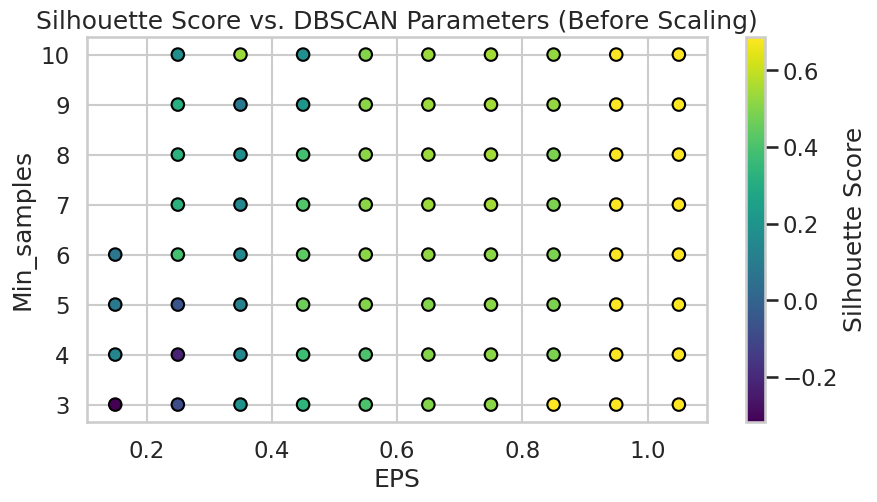

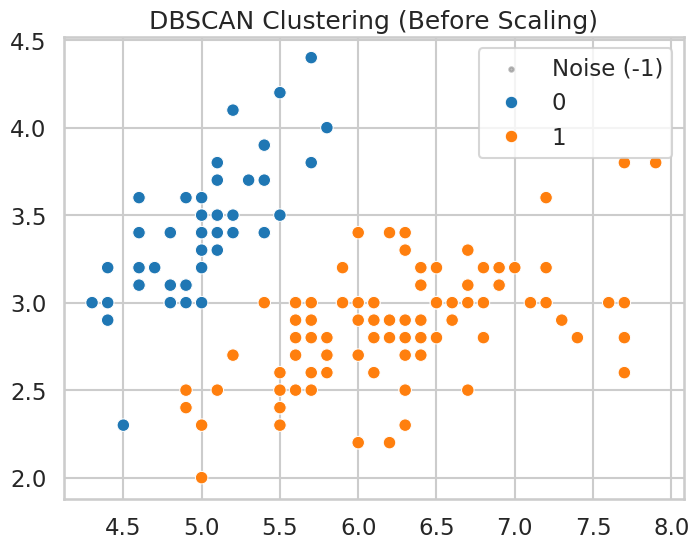


--- DBSCAN After Scaling ---


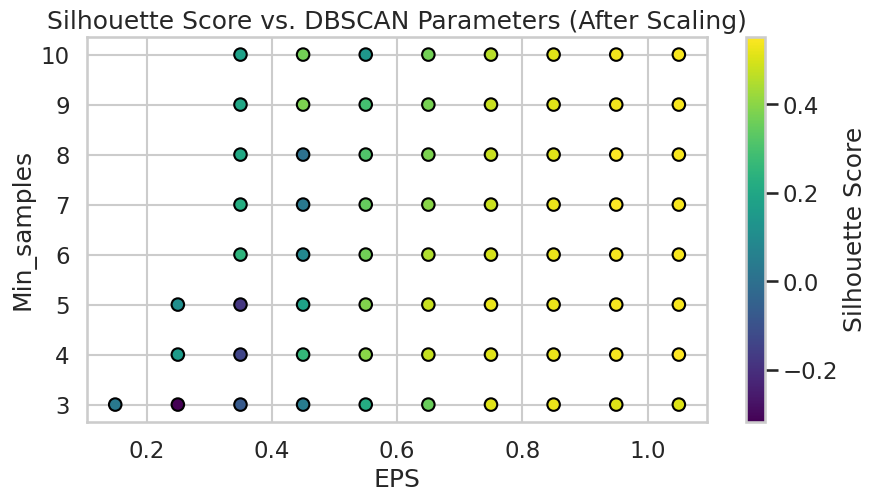

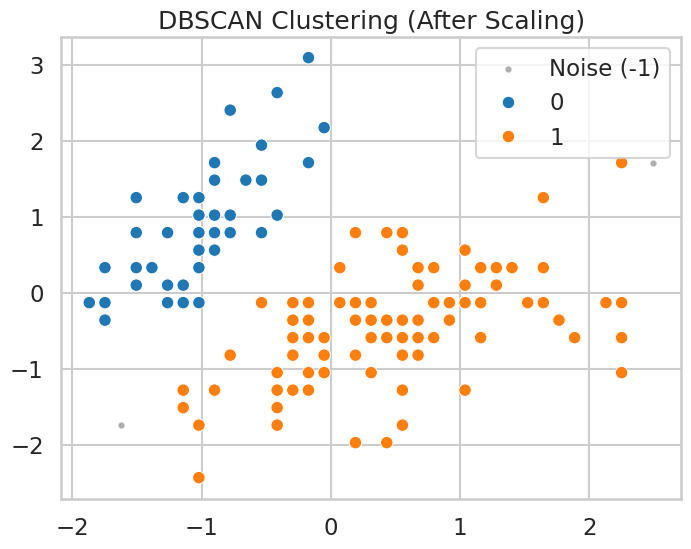


--- Comparison of Results ---
Best DBSCAN Parameters Before Scaling: EPS=0.8500000000000002, Min_samples=3
Best Silhouette Score Before Scaling: 0.6867
Best DBSCAN Parameters After Scaling: EPS=1.0500000000000003, Min_samples=4
Best Silhouette Score After Scaling: 0.5518


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import load_iris

# Load the Iris dataset
iris = load_iris()
X = iris.data  # Use all features

# Function to apply DBSCAN and analyze results
def apply_dbscan(X, description, eps_values, min_samples_values):
    best_score = -1
    best_params = None
    silhouette_scores_dbscan = {}

    for eps in eps_values:
        for min_samples in min_samples_values:
            try:
                dbscan = DBSCAN(eps=eps, min_samples=min_samples)
                labels = dbscan.fit_predict(X)

                # Ignore silhouette score if all points are in one cluster or noise
                if len(set(labels)) <= 1:
                    continue

                sil_score = silhouette_score(X, labels)
                silhouette_scores_dbscan[(eps, min_samples)] = sil_score

                # Track the best parameters
                if sil_score > best_score:
                    best_score = sil_score
                    best_params = (eps, min_samples)
                    best_labels = labels

            except Exception as e:
                print(f"Skipping EPS={eps}, Min_samples={min_samples} due to error: {e}")

    # Plot Silhouette Score vs. EPS & Min_samples
    plt.figure(figsize=(10, 5))
    x_vals, y_vals, z_vals = zip(*[(eps, min_samples, score) for (eps, min_samples), score in silhouette_scores_dbscan.items()])
    sc = plt.scatter(x_vals, y_vals, c=z_vals, cmap='viridis', edgecolor='k')
    plt.colorbar(sc, label="Silhouette Score")
    plt.xlabel("EPS")
    plt.ylabel("Min_samples")
    plt.title(f"Silhouette Score vs. DBSCAN Parameters ({description})")
    plt.show()

    # Apply DBSCAN with Best Parameters & Plot Clusters
    best_eps, best_min_samples = best_params
    dbscan_best = DBSCAN(eps=best_eps, min_samples=best_min_samples)
    final_labels = dbscan_best.fit_predict(X)

    # Extract noise and cluster points
    noise_mask = final_labels == -1
    clusters_mask = final_labels != -1

    plt.figure(figsize=(8, 6))

    # Plot noise points in gray
    plt.scatter(X[noise_mask, 0], X[noise_mask, 1], c='gray', label='Noise (-1)', alpha=0.5, s=10)

    # Plot clusters, ensuring unique colors
    unique_labels = np.unique(final_labels[clusters_mask])  # Exclude noise (-1)
    palette = sns.color_palette("tab10", len(unique_labels))

    sns.scatterplot(
        x=X[clusters_mask, 0],
        y=X[clusters_mask, 1],
        hue=final_labels[clusters_mask],
        palette=palette,
        legend="full"
    )

    plt.title(f"DBSCAN Clustering ({description})")
    plt.legend()
    plt.show()

    # Return best parameters and silhouette score for comparison
    return best_eps, best_min_samples, best_score


# Set EPS and Min_samples ranges for fine-tuning
eps_values = np.arange(0.05, 1.1, 0.1)  # Adjust EPS range for finer exploration
min_samples_values = range(3, 11)  # Lower Min_samples for potential better results

# 1. Apply DBSCAN on Original Data
print("\n--- DBSCAN Before Scaling ---")
best_eps_before, best_min_samples_before, best_score_before = apply_dbscan(X, "Before Scaling", eps_values, min_samples_values)

# 2. Scale Data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 3. Apply DBSCAN on Scaled Data
print("\n--- DBSCAN After Scaling ---")
best_eps_after, best_min_samples_after, best_score_after = apply_dbscan(X_scaled, "After Scaling", eps_values, min_samples_values)

# 4. Compare Results
print("\n--- Comparison of Results ---")
print(f"Best DBSCAN Parameters Before Scaling: EPS={best_eps_before}, Min_samples={best_min_samples_before}")
print(f"Best Silhouette Score Before Scaling: {best_score_before:.4f}")
print(f"Best DBSCAN Parameters After Scaling: EPS={best_eps_after}, Min_samples={best_min_samples_after}")
print(f"Best Silhouette Score After Scaling: {best_score_after:.4f}")


Before Scaling: The best silhouette score was 0.6867, indicating well-separated clusters with a relatively small EPS (0.85) and low Min_samples (3), suggesting that DBSCAN was able to find clear clusters in the unscaled data.

After Scaling: The best silhouette score decreased to 0.5518, and the optimal parameters shifted to a slightly higher EPS (1.05) and Min_samples (4). This change suggests that scaling made the data more spread out, requiring a larger EPS to capture meaningful clusters. However, the lower silhouette score indicates less separation and cohesion in the scaled data compared to the unscaled data.

## Customer dataset
Repeat all the above on the customer data set

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
import pandas as pd

# Load the dataset into a pandas DataFrame
dataset_path = os.path.join(dataset_folder, 'Customer_data.csv')  # Adjust file name if needed
df = pd.read_csv(dataset_path)

# Display the first few rows to check the data
df.head()


,ID,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
0,100000001,0,0,67,2,124670,1,2
1,100000002,1,1,22,1,150773,1,2
2,100000003,0,0,49,1,89210,0,0
3,100000004,0,0,45,1,171565,1,1
4,100000005,0,0,53,1,149031,1,1


In [ ]:
# Check for any missing values
df.isnull().sum()

,0
ID,0
Sex,0
Marital status,0
Age,0
Education,0
Income,0
Occupation,0
Settlement size,0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype
---  ------           --------------  -----
 0   ID               2000 non-null   int64
 1   Sex              2000 non-null   int64
 2   Marital status   2000 non-null   int64
 3   Age              2000 non-null   int64
 4   Education        2000 non-null   int64
 5   Income           2000 non-null   int64
 6   Occupation       2000 non-null   int64
 7   Settlement size  2000 non-null   int64
dtypes: int64(8)
memory usage: 125.1 KB


In [ ]:
# Scaling the dataset
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df.drop(columns=['ID']))

Kmeans

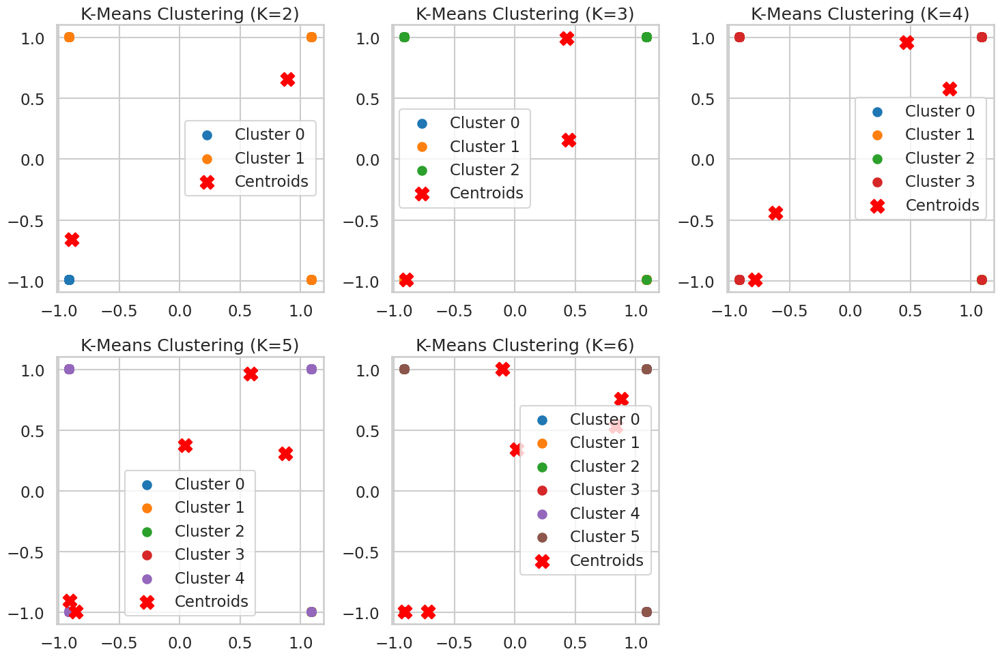

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans

# Define K values to test
K_values = [2, 3, 4, 5, 6]  # You can adjust the range of K based on the dataset

# Set plot style
sns.set_style("whitegrid")
plt.figure(figsize=(15, 10))

# Apply K-Means for each K and plot results
for i, k in enumerate(K_values, 1):
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
    labels = kmeans.fit_predict(df_scaled)  # Use the scaled dataset

    plt.subplot(2, 3, i)  # Create subplots for each K value
    for j in range(k):
        plt.scatter(df_scaled[labels == j, 0], df_scaled[labels == j, 1], label=f'Cluster {j}')

    # Plot centroids
    plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1],
                c='red', marker='X', s=200, label='Centroids')

    plt.title(f'K-Means Clustering (K={k})')
    plt.legend()

plt.tight_layout()
plt.show()


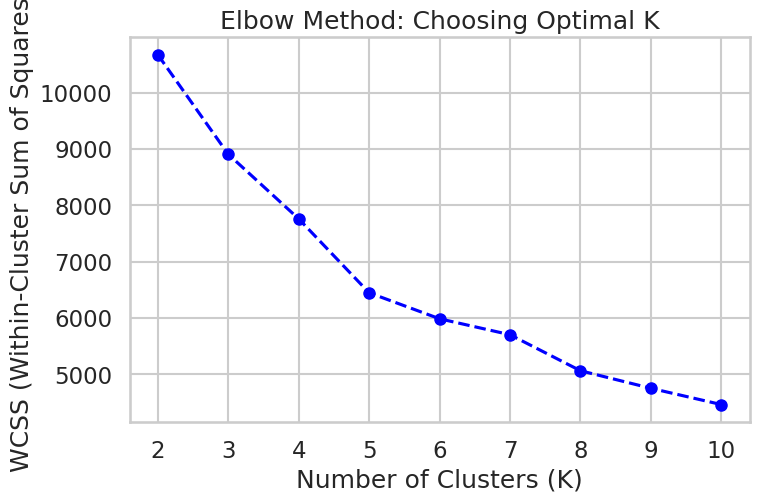

In [ ]:
# Define range of K values
K_range = range(2, 11)

# Compute WCSS (Within-Cluster Sum of Squares) for each K
wcss = []  # Store WCSS values

for k in K_range:
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
    kmeans.fit(df_scaled)  # Fit the scaled data
    wcss.append(kmeans.inertia_)  # Store distortion score (WCSS)

# Plot Elbow Method
plt.figure(figsize=(8, 5))
plt.plot(K_range, wcss, marker='o', linestyle='--', color='b', markersize=8)
plt.xlabel('Number of Clusters (K)')
plt.ylabel('WCSS (Within-Cluster Sum of Squares)')
plt.title('Elbow Method: Choosing Optimal K')
plt.xticks(K_range)
plt.grid(True)
plt.show()


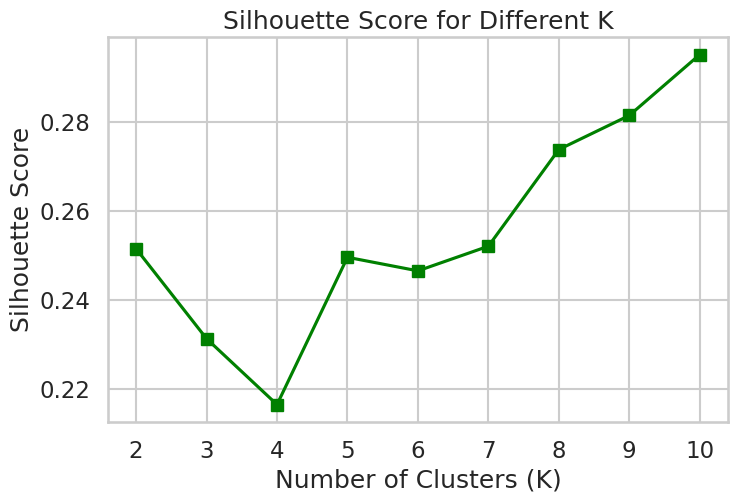

Best K based on Silhouette Score: 10 with Score: 0.2951


In [ ]:
from sklearn.metrics import silhouette_score

# Compute Silhouette Scores for K = 2 to 10
sil_scores = []
K_range = range(2, 11)

for k in K_range:
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
    labels = kmeans.fit_predict(df_scaled)  # Fit the scaled data
    sil_scores.append(silhouette_score(df_scaled, labels))  # Compute Silhouette Score

# Plot Silhouette Score vs K
plt.figure(figsize=(8, 5))
plt.plot(K_range, sil_scores, marker='s', linestyle='-', color='g', markersize=8)
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for Different K')
plt.xticks(K_range)
plt.grid(True)
plt.show()

# Identify best K based on highest Silhouette Score
best_K = K_range[sil_scores.index(max(sil_scores))]
best_silhouette = max(sil_scores)

print(f"Best K based on Silhouette Score: {best_K} with Score: {best_silhouette:.4f}")


Heirarchal

In [ ]:
import numpy as np
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score

# Define the parameters for affinity, linkage, and distance threshold
distance_measures = ['euclidean', 'cityblock', 'cosine']
linkage_methods = ['ward', 'average', 'complete', 'single']
distance_limits = [6, 8, 10, 12]

# Variables to track the best score and parameters
highest_score = -1
optimal_config = {}
cluster_count = -1

# Store results for each configuration
agg_results = {}

# Loop through different combinations of parameters
for distance in distance_measures:
    for linkage_type in linkage_methods:
        for limit in distance_limits:
            try:
                # Create the clustering model with specific parameters
                cluster_model = AgglomerativeClustering(n_clusters=None, metric=distance,
                                                        linkage=linkage_type,
                                                        distance_threshold=limit)

                # Fit the model and get cluster labels
                labels = cluster_model.fit_predict(df_scaled)

                # Calculate silhouette score
                score = silhouette_score(df_scaled, labels)

                # Get the number of unique clusters, excluding noise
                unique_clusters = len(set(labels) - {-1})

                # Store the silhouette score for the current configuration
                agg_results[(distance, linkage_type, limit)] = score

                # Check if this configuration gives a better score and more than one cluster
                if score > highest_score and unique_clusters > 1:
                    highest_score = score
                    optimal_config = {'metric': distance, 'linkage_method': linkage_type, 'threshold': limit}
                    cluster_count = unique_clusters

            except Exception as e:
                print(f"Skipping config {distance}, {linkage_type}, Threshold={limit}: {e}")

# Print summary of results
print("\nClustering Performance for Different Configurations:")
for config, score in agg_results.items():
    print(f"Affinity={config[0]}, Linkage={config[1]}, Threshold={config[2]} → Silhouette Score: {score:.4f}")

# Output the best parameters and score
print(f"\nOptimal Agglomerative Clustering Configuration: {optimal_config}")
print(f"Best Silhouette Score: {highest_score:.4f}")


Skipping config euclidean, average, Threshold=8: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Skipping config euclidean, average, Threshold=10: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Skipping config euclidean, average, Threshold=12: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Skipping config euclidean, complete, Threshold=10: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Skipping config euclidean, complete, Threshold=12: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Skipping config euclidean, single, Threshold=6: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Skipping config euclidean, single, Threshold=8: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Skipping config euclidean, single, Threshold=10: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Skipping config euclidean, single, T

DBScan


Optimal DBSCAN Parameters:
EPS: 1.500, Min Samples: 50, Clusters: 11
Best Silhouette Score: 0.2473


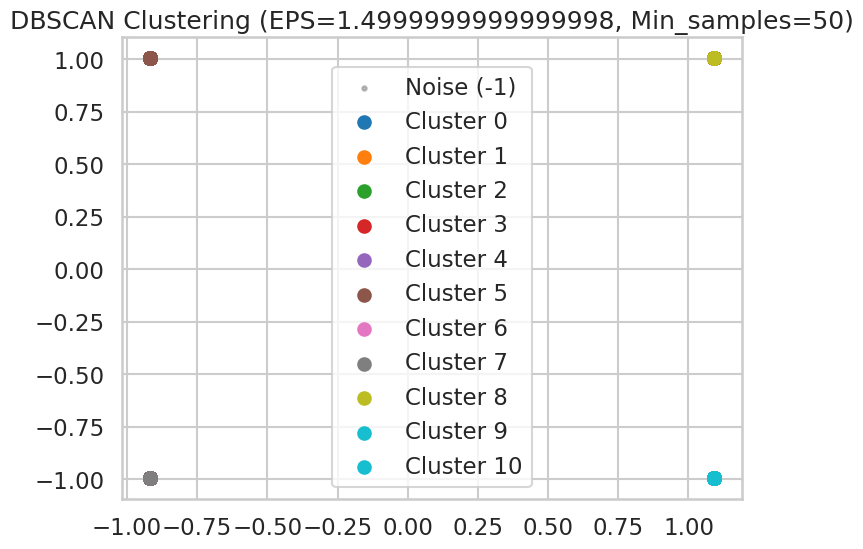

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.neighbors import NearestNeighbors
from itertools import product

# Step 1: Set up parameters
eps_values = np.arange(0.5, 2.0, 0.1)  # Test smaller EPS values from 0.5 to 2.0
min_samples_values = np.arange(50, 200, 3)  # Vary the Min_samples from 50 to 200 with step size of 3

best_score = -1
best_params = None

# Step 2: Perform DBSCAN clustering for each combination of EPS and Min_samples
for eps, min_samples in product(eps_values, min_samples_values):
    # Initialize DBSCAN with the given EPS and Min_samples
    dbscan_model = DBSCAN(eps=eps, min_samples=min_samples)
    labels = dbscan_model.fit_predict(df_scaled)

    # Step 3: Exclude noise (-1) and only consider clusters with more than one cluster
    cluster_labels = set(labels) - {-1}
    if len(cluster_labels) > 1:  # Skip if only one cluster or no clusters
        silhouette = silhouette_score(df_scaled, labels)  # Compute the silhouette score

        # Step 4: Update best parameters if a better silhouette score is found
        if silhouette > best_score:
            best_score = silhouette
            best_params = (eps, min_samples, len(cluster_labels))

# Step 5: Output the best parameters and the corresponding silhouette score
print("\nOptimal DBSCAN Parameters:")
print(f"EPS: {best_params[0]:.3f}, Min Samples: {best_params[1]}, Clusters: {best_params[2]}")
print(f"Best Silhouette Score: {best_score:.4f}")

# Step 6: Visualize the clustering result with the optimal parameters
dbscan_optimal = DBSCAN(eps=best_params[0], min_samples=best_params[1])
optimal_labels = dbscan_optimal.fit_predict(df_scaled)

# Extract clusters and noise
cluster_mask = optimal_labels != -1
noise_mask = optimal_labels == -1

# Plot the clusters
plt.figure(figsize=(8, 6))

# Plot noise in gray
plt.scatter(df_scaled[noise_mask, 0], df_scaled[noise_mask, 1], c='gray', label='Noise (-1)', alpha=0.5, s=10)

# Plot clusters with different colors
unique_labels = np.unique(optimal_labels[cluster_mask])  # Exclude noise
palette = plt.cm.get_cmap('tab10', len(unique_labels))

for i, cluster_id in enumerate(unique_labels):
    cluster_points = df_scaled[optimal_labels == cluster_id]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], color=palette(i), label=f'Cluster {i}')

plt.title(f"DBSCAN Clustering (EPS={best_params[0]}, Min_samples={best_params[1]})")
plt.legend()
plt.show()


Best Performing Algorithm (based on Silhouette Score): Hierarchical Clustering with Euclidean distance, Ward linkage, and a threshold of 6 yielded the highest Silhouette Score (0.4421). This suggests it might be the most effective of the three for identifying relatively well-separated customer segments.